## Initializations and funciton definitions
now would be the time when I would typically transfer the functions below to a separate class / package. But I rather want to finish an example of Bayesian routine for recycling.

In [1]:
## needed to first call  in terminal:
! systemctl stop opentrons-robot-server 

In [1]:
import opentrons.execute
import time
protocol = opentrons.execute.get_protocol_api("2.21")

from pydantic import BaseModel, Field
from typing import Optional, List
from enum import Enum

from datetime import datetime, timezone
import numpy as np
from lmfit import Model
import json

import matplotlib.pyplot as plt

from threading import Thread
import os 
from opentrons.types import Point, Location ## for arbitrary movements
from threading import Thread ## for concurrent action + measurement
import asyncio
import time

## sensor stuff: 
from opentrons_hardware.sensors.types import SensorDataType, EnvironmentSensorDataType
from opentrons_hardware.drivers.can_bus import DriverSettings, settings, build

from opentrons_hardware.drivers.can_bus.can_messenger import CanMessenger
from opentrons_hardware.drivers.can_bus.abstract_driver import AbstractCanDriver
from opentrons_hardware.firmware_bindings.constants import NodeId, SensorType, SensorId
from opentrons_hardware.sensors import sensor_driver, sensor_types

driver_settings = DriverSettings(
        interface=settings.DEFAULT_INTERFACE,
        port=settings.DEFAULT_PORT,
        host=settings.DEFAULT_HOST,
        bit_rate=settings.DEFAULT_BITRATE,
        channel=settings.DEFAULT_CHANNEL,
    )
node_id = NodeId.pipette_left # from https://github.com/Opentrons/opentrons/blob/edge/hardware/opentrons_hardware/scripts/sensors.py
pressure_sensor = sensor_types.PressureSensor.build(SensorId.S0, node_id)
s_driver = sensor_driver.SensorDriver()


/data/robot_settings.json not found. Loading defaults
/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/lmfit/confidence.py:6: UserWarning: A NumPy version >=1.23.5 and <2.5.0 is required for this version of SciPy (detected version 1.22.3)
  from scipy.optimize import root_scalar


In [2]:
# labware
plate = protocol.load_labware(
    "corning_96_wellplate_360ul_flat", location="C2"
)
tiprack = protocol.load_labware(
    "opentrons_flex_96_tiprack_1000ul", location="B2"
)
trash = protocol.load_trash_bin(location="A3")

raw_material_plate = protocol.load_labware(
    "opentrons_6_tuberack_falcon_50ml_conical", location="C1"
)

# pipettes
left_pipette = protocol.load_instrument(
    "flex_1channel_1000", mount="left", tip_racks=[tiprack]
)


In [3]:
## some utility functions for tip handling

soap_aspirate_location = raw_material_plate["A1"].bottom(z = 10)
soap_wait_location = raw_material_plate["A1"].bottom(z = 40)
water_aspirate_location = raw_material_plate["B1"].bottom(z = 10)

def pick_up_soap_tip():
    left_pipette.pick_up_tip(location = tiprack.wells()[90])
    
def return_soap_tip():
    left_pipette.drop_tip(location = tiprack.wells()[90])
    
def pick_up_water_tip():
    left_pipette.pick_up_tip(location = tiprack.wells()[91])
    
def return_water_tip():
    left_pipette.drop_tip(location = tiprack.wells()[91])    

if False: 
    ## testing
    pick_up_soap_tip()
    return_soap_tip()
    pick_up_water_tip()
    return_water_tip()

In [4]:
protocol.home()

In [5]:
### class to controll pressure sensor independently 
class PressureReader:
    def __init__(self):
        
        self.measure_thread = None
        self.stop_measurement = False
        self.driver = build.driver(driver_settings)
        self.last_pressure = None
    async def measure_pressure_async(self):
        """measure pressure until self. stop_measurement is True"""
        self.stop_measurement = False
        t_start = time.time()
        async with build.driver(driver_settings) as driver:
            messenger = CanMessenger(driver=driver)
            messenger.start()
            while not self.stop_measurement:
                data = await s_driver.read(messenger, pressure_sensor, offset=False, timeout=10)
                self.last_pressure = data.to_float()
                
    def measure_pressure_loop(self):
        asyncio.run(self.measure_pressure_async())
                
    def start_measuring(self):
            
        self.measure_thread = Thread(target = self.measure_pressure_loop)
        self.measure_thread.start()
        
    def measure_once(self, timeout = 10):
        self.last_pressure = None
        self.start_measuring()
        t_start = time.time()
        while self.last_pressure is None:
            #print("last_pressure:", self.last_pressure)
            #print("time passed:", time.time()-t_start)
            if self.last_pressure is not None:
                break
            if time.time()-t_start > timeout:
                self.stop_measurement = True
                raise Exception("no pressure could be read, timeout!")
            time.sleep(0.01)
        self.stop_measurement = True
        self.measure_thread.join()
        return self.last_pressure
                
if False: 
    pressure_reader = PressureReader()
    print(pressure_reader.measure_once())
    print(pressure_reader.stop_measurement)
    print(pressure_reader.measure_thread)
    time.sleep(0.1)
    print(pressure_reader.measure_thread)
    
    for i in range(10):
        print(pressure_reader.measure_once())

In [6]:
## function to aspirate viscous liquid and set reduce pressure afterwards, to not suck in further air. 



def aspirate_pressureless(volume_ul, 
                                      location, 
                                      overaspirate = True,
                                      overaspirate_volume_ul = 10,
                                      wait_s = 15,
                                      finish_threshold = -300, ## must be quite high or gravity force will caus no ending.
                                      fast_threshold = -1000, 
                                      fast_volume_ul=10, 
                                      slow_volume_ul = 1):
    """aspirates, waits, removes overpressure"""
    print("aspiration target: ", volume_ul, " ul")
    if overaspirate: 
        volume_ul = volume_ul+ overaspirate_volume_ul
        if volume_ul > 200:
            volume_ul = 200
    left_pipette.aspirate(volume_ul ,location)
    print("aspirated. wait for settling")
    time.sleep(wait_s)
    pressure_reader = PressureReader()
    
    pressure = pressure_reader.measure_once()
    while pressure < finish_threshold:

        if pressure < fast_threshold:
            left_pipette.dispense(fast_volume_ul)
        else:
            left_pipette.dispense(slow_volume_ul)
        pressure = pressure_reader.measure_once()
        #print("current pressure:", pressure)
    print('finally aspirated ', left_pipette.current_volume, ' ul')
    
## aspirate, wait for 10s.

if False: 
    #return_soap_tip()
    #pick_up_soap_tip()
    aspirate_pressureless(198, soap_aspirate_location)
    left_pipette.move_to(soap_wait_location)

In [78]:
## some utility functions for material transfer



def transfer_material_to_well(volume_ul = None,
                              n_well=None, 
                              wait_time_s = 30,
                              material_origin_location: Location = None,
                              material_pipette_well = None,
                              acceptable_rest_ul = 10,
                             use_mounted_pipette =False): ## wait time must be pretty long if actual soap is being transferred
    """transfer material to well with index n"""
    if material_origin_location is None: 
        material_origin_location = soap_aspirate_location
    displacement = Point(x=0, y=0, z=30)
    material_wait_location = Location(point = material_origin_location.point+ displacement, labware=None)
   
    ## todo: aspirate more than necessary, to pull the pipette out of the liquid with zero pressure. maybe use pressure sensor to check.
    if volume_ul is None or n_well is None: 
        raise Exception("volume or well not specified, do nothing")
        
    print(f"transfer {volume_ul} ul material to well {n_well}")
    if volume_ul ==0:
        left_pipette.return_tip()
        return
    if not use_mounted_pipette:
        if material_pipette_well == None:
            pick_up_soap_tip()
        else: 
            left_pipette.pick_up_tip(material_pipette_well)
    
    amount_left = volume_ul
    
    while amount_left> acceptable_rest_ul:
        if acceptable_rest_ul > 150:
            amount_ul = 150
        else:
            amount_ul = amount_left
        aspirate_pressureless(amount_ul,
                              material_origin_location,
                              overaspirate_volume_ul = amount_ul*0.1) ## 200 ul will not be reached, typically 150 ul
        amount_left -= left_pipette.current_volume
        ## move 30 mm up and 
        left_pipette.move_to(material_wait_location)
        time.sleep(wait_time_s) #wait another wait time to get rid of material sticking to the outside of the pipette.

        target_well = plate.wells()[n_well]
        left_pipette.dispense(left_pipette.current_volume, target_well.bottom(z=10), rate= 0.05)
        time.sleep(5/6*wait_time_s)
        left_pipette.blow_out()
        time.sleep(wait_time_s/6) ## wait for liquid to settle. important for soap. Sleep after blowout, otherwise pressure is not good enough.
    left_pipette.return_tip()
    
def transfer_water_to_well(volume_ul = None, n_well=None, wait_time_s = 0.3):
    """transfer water to well with index n"""
    if volume_ul is None or n_well is None: 
        raise Exception("volume or well not specified, do nothing")
        
    print(f"transfer {volume_ul} ul water to well {n_well}")
    pick_up_water_tip()
    left_pipette.aspirate(volume_ul, water_aspirate_location)
    
    time.sleep(wait_time_s) ## wait for liquid to settle. can be shorter for water
    
    target_well = plate.wells()[n_well]
    left_pipette.dispense(volume_ul, target_well.bottom(z=10))
    left_pipette.blow_out()
    return_water_tip()

if False: 
    ## testing
    #volumes = [50, 110, 200]
    #for i, volume in enumerate(volumes):
    #    transfer_soap_to_well(volume_ul=volume, n_well=i+6, wait_time_s = 20)
    transfer_water_to_well(volume_ul=200, n_well=10)


In [79]:
def stirr(n_well, n_rounds:int=1, r:float=1.5):
    base_location = Location(point=plate.wells()[n_well].bottom().point + Point(x=0, y=0, z=0.5), labware=None)
    angles = np.linspace(0,2*np.pi,7)
    
    locations = []
    
    for i in range(n_rounds+1):
        for angle in angles:
            x = r*np.sin(angle)
            y = r*np.cos(angle)
            z = 0 
            rel_point = Point(x=x, y=y, z=z)
            locations.append(Location(point = base_location.point+ rel_point, labware=None))
   

    ## actually move
    # move savely to start location
    left_pipette.move_to(base_location, force_direct=False)
    # stirr
    for loc in locations: 
        left_pipette.move_to(loc, force_direct=True)
    left_pipette.move_to(base_location, force_direct=True)
    
if False: 
    #left_pipette.pick_up_tip(tiprack.wells()[0])
    stirr(n_well=0, n_rounds=10)

In [80]:
# Liquid preparation function

def prepare_mix(n_well, 
                material_origin_location = None, 
                material_pipette_well = None ,
                use_mounted_pipette = False,
                material_fraction = 0.5,
                water_fraction = 0.5, 
                total_volume_ul = 200):
    """prepare a mix, here from material or material-water and water"""
    if abs(1-material_fraction - water_fraction) > 0.001:
        raise Exception("fractions do not add up to 1")
        
    # lets limit it to 300 ul for now -> liquid surface well below 
    if total_volume_ul > 300:
        raise Exception("volume too high, currently limited to 300 ul")
    
    material_volume_ul = total_volume_ul*material_fraction
    water_volume_ul = total_volume_ul*water_fraction
    
    
    transfer_material_to_well(n_well=n_well,
                          material_origin_location = material_origin_location, 
                          material_pipette_well = material_pipette_well,
                          volume_ul=material_volume_ul,
                          use_mounted_pipette = use_mounted_pipette )
    
    ## transfer liquids
    transfer_water_to_well(n_well=n_well, 
                          volume_ul=water_volume_ul)
    
if False: 
    ## testing
    ## first with raw materials
    mix_well = 9
    target_well = 10
    prepare_mix(n_well=mix_well, 
                material_fraction = 0.5, 
                water_fraction = 0.5)
    
    ## stirr 
    left_pipette.pick_up_tip(tiprack.wells()[mix_well])
    stirr(mix_well, n_rounds = 10)
    left_pipette.mix(10, 100, plate.wells()[mix_well].bottom(z=1.0))
    stirr(mix_well, n_rounds = 10)
    left_pipette.mix(10, 100, plate.wells()[mix_well].bottom(z=1.0))
    left_pipette.return_tip()
    
    ## with diluted material as origin
    prepare_mix(n_well=target_well, 
                material_origin_location = plate.wells()[mix_well].bottom(z=1), 
                material_pipette_well = tiprack.wells()[mix_well],
                material_fraction = 0.5,
                water_fraction = 0.5)
    
    ## stirr 
    left_pipette.pick_up_tip(tiprack.wells()[target_well])
    stirr(target_well, n_rounds = 10)
    left_pipette.mix(10, 100, plate.wells()[target_well].bottom(z=1.0))
    stirr(target_well, n_rounds = 10)
    left_pipette.mix(10, 100, plate.wells()[target_well].bottom(z=1.0))
    left_pipette.return_tip()


In [10]:
class ModeEnum(str, Enum):
    idle = "idle"
    aspirate = "aspirate"
    wait_after_aspirate = "wait_after_aspirate"
    dispense = "dispense"
    wait_after_dispense = "wait_after_dispense"

class MeasurementPoint(BaseModel):
    seconds_since_start: float = Field(description = "seconds since the start of this measurement")
    utc_timestamp: str = Field(description = "timestamp (in utc) taken immediately after pressure value has been received. ")
    pressure_au: float = Field(description = "pressure reading in arbitrary units (they are not know, so far)")
    mode: ModeEnum = Field(description = "current mode, e.g. aspirate, wait_after_aspirate, dispense,...") 
    
class ViscosityProxyResult(BaseModel):
    raw_data: List[MeasurementPoint] = Field(default = [], description = "List containing all measurement points")
    fit_report_aspirate: Optional[str] = Field(description = "Fit report as created by LMFit, for decay after aspirating")
    decay_time_aspirate: Optional[float] = Field(description = "Decay time, resulting from fit, for decay after aspirating")
    fit_report_dispense: Optional[str] = Field(description = "Fit report as created by LMFit, for decay after dispensing")
    decay_time_dispense: Optional[float] = Field(description = "Decay time, resulting from fit, for decay after dispensing")
    pressure_integral_aspirate: Optional[float] = Field(description = "-time-integrated pressure including aspiration and pressure drop")
    pressure_integral_dispense: Optional[float] = Field(description = "time-integrated pressure including dispensing and pressure drop")
    pressure_integral_corrected: Optional[float] = Field(description = "time-integrated pressure average between aspiration and dispensing, (correct for gravity)")
    derivative_proxy_offset: Optional[float] = Field(description = "viscosity proxy generated by derivative divided by pressure value, zero_pressure part (offset)")
    derivative_proxy_slope: Optional[float] = Field(description = "viscosity proxy generated by derivative divided by pressure value, slope")
    derivative_proxy_mean: Optional[float] = Field(description = "viscosity proxy generated by derivative divided by pressure value mean of measured")  
  
class ViscosityProxyEvaluator():
    """a class containing funcitons for pressure measurment and simultaneous movement"""
    def __init__(self, pipette = left_pipette):
        
        self.pipette = pipette
        self.stop_measurment = False
        self.driver = build.driver(driver_settings)
        self.current_mode = ModeEnum.idle
        self.result = ViscosityProxyResult()
        
        
    async def measure_pressure_async(self):
        """measure pressure until self. stop_measurement is True"""
        self.stop_measurement = False
        t_start = time.time()
        self.last_pressure_au = None
        async with build.driver(driver_settings) as driver:
            messenger = CanMessenger(driver=driver)
            messenger.start()
            while not self.stop_measurement:
                data = await s_driver.read(messenger, pressure_sensor, offset=False, timeout=10)
                self.last_pressure_au = data.to_float()
                #print("current volume:",self.pipette.current_volume) # this does not work live.
                point = MeasurementPoint(
                    seconds_since_start = (time.time()-t_start),
                    utc_timestamp = datetime.now(timezone.utc).astimezone(timezone.utc).strftime('%Y-%m-%d %H:%M:%S.%f'),
                    pressure_au = data.to_float(),
                    mode = self.current_mode,
                )
                self.result.raw_data.append(point)
                
    def measure_pressure(self):
        asyncio.run(self.measure_pressure_async())
        
    def measure_viscosity_proxies(self, n_well = None, location = None, volume_ul = 50,
                                  pre_aspirate_ul = 10, pre_aspirate_settle_time_s = 2,
                                  settle_time_s = 10, p_thresh_asp = -100, p_thresh_disp = 100):
        
        
        if location is not None: 
            location = location
        else:
            location = plate.wells()[n_well]
        ## pre-aspirate to already break surface tension.
        aspirate_pressureless(pre_aspirate_ul, location, wait_s = pre_aspirate_settle_time_s, overaspirate = False)
        
        measurement_points = []
        
        ## parallel thread that reads pressures and documents
        t = Thread(target = self.measure_pressure)
        t.start()
        
        ## aspirate
        self.current_mode = ModeEnum.aspirate
        self.pipette.aspirate(volume_ul, location)
        
        ## wait after aspiration until pressure increases above p_thresh_asp
        self.current_mode = ModeEnum.wait_after_aspirate
        time.sleep(settle_time_s)
        #t_wait_start = time.time()
        #while self.last_pressure_au < p_thresh_asp or time.time()-t_wait_start < settle_time_s:
        #    time.sleep(0.1)
        
        ## dispense 
        self.current_mode = ModeEnum.dispense
        self.pipette.dispense(volume_ul, location)
        
        ## wait after aspiration until pressure increases above p_thresh_asp
        self.current_mode = ModeEnum.wait_after_dispense
        time.sleep(settle_time_s)
        #t_wait_start = time.time()
        #while self.last_pressure_au > p_thresh_disp or time.time()-t_wait_start < settle_time_s:
        #    time.sleep(0.1)
        
        ## give thread signal to stop measuring: 
        self.stop_measurement = True
        t.join()
        print("measurement finished")
        
        self.pipette.dispense(self.pipette.current_volume) ## needed due to pre-aspiration
        ## evaluate
        self.visualize_overview()
        self.evaluate_decay_times()
        self.evaluate_pressure_integral()
        try:
            self.evaluate_derivative()
        except Exception as e:
            print("could not evaluate derivatives",e)
        self.save_result()
        
        return self.result

    def save_result(self):
        result_dict = self.result.dict()
        start_timestamp = self.result.raw_data[0].utc_timestamp
    
        
        with open(f"data/result_{start_timestamp.replace('.','_').replace(':','_')}.json", 'w') as f:
            json.dump(result_dict, f, indent=4)
            
    def visualize_overview(self):
        
        times = [point.seconds_since_start for i,point in enumerate(self.result.raw_data)]
        pressures = [point.pressure_au for i,point in enumerate(self.result.raw_data)]
        
        a_times = [point.seconds_since_start for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_aspirate]
        a_pressures = [point.pressure_au for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_aspirate]
        
        d_times = [point.seconds_since_start for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_dispense]
        d_pressures = [point.pressure_au for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_dispense]
        
        
        
        ## overview
        fig, ax = plt.subplots()
        
        ax.plot(times, pressures, color = "blue")
        ax.scatter(times, pressures, color = "blue")
        
        ax.plot(a_times, a_pressures, color = "black")
        ax.scatter(a_times, a_pressures, color = "black")
        
        
        ax.plot(d_times, d_pressures, color = "black")
        ax.scatter(d_times, d_pressures, color = "black")
        
        ax.grid(True)
        ax.set_xlabel("time in s")
        ax.set_ylabel("pressure in a.u.")
        
        start_timestamp = self.result.raw_data[0].utc_timestamp
        fig.savefig(f"visualizations/overview_utc_{start_timestamp.replace('.','_').replace(':','_')}.png")
    
    def evaluate_decay_times(self):
        
        ## prepare plot
        fig, (ax_asp, ax_disp) = plt.subplots(ncols = 2, figsize = (8,4))
        
        ## Create a model
        def exponential_curve(x, a, tau, c):
            return a*np.exp(-x/tau) + c

        model = Model(exponential_curve)
        
        # evaluate decay time from aspiration:
        times = [point.seconds_since_start for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_aspirate]
        # zero times 
        times = np.array(times)
        times = times-np.min(times)
        pressures = [point.pressure_au for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_aspirate]
        
        ## disregard some of the first values:
        #times = times[5::]
        #pressures = pressures[5::]

        # Set initial parameters and limits
        params = model.make_params(a=-500, tau=0.01, c=0)  # Set initial parameters, specific for aspiration (negative pressures)
        params['tau'].min = 0
        params['tau'].max = 100
        params['c'].min = -9000
        params['c'].max = 9000
        params['a'].min = -9000 ## this can only be so close if times are shifted to begin with zero. then a is the maximum value, which is limited by pressure sensor
        params['a'].max = 9000
        
        
        # Fit the model to aspiration data

        result = model.fit(pressures,#[i_start: i_stop],
                              x=times,#[i_start: i_stop],
                              params=params)
        print(result.fit_report())

        # Print the fit report
        self.result.fit_report_aspirate = result.fit_report()
        self.result.decay_time_aspirate = result.best_values['tau']

        ax_asp.plot(times,pressures)
        ax_asp.plot(times,#[i_start: i_stop],
                result.best_fit, color="red", label=r'$\tau_i$ = {:.2f} s'.format(result.best_values['tau']) + r' $c$ = {:.2f} '
                                                                                              r'a.u.'.format(
                             result.best_values['c']))
        ax_asp.scatter(times,pressures)
        ax_asp.set_xlabel("time in s")
        ax_asp.set_ylabel("pressure in a.u.")
        ax_asp.legend()
        ax_asp.grid(True)
        
        ## same for dispense:
        # evaluate decay time from wait after dispense:
        times = [point.seconds_since_start for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_dispense]
        # zero times 
        times = np.array(times)
        times = times-np.min(times)
        pressures = [point.pressure_au for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_dispense]
        
        ## disregard some of the first values:
        #times = times[5::]
        #pressures = pressures[5::]
        
        # Set initial parameters and limits
        params = model.make_params(a=500, tau=0.01, c=0)  # Set initial parameters, specific for dispense (positive pressures)
        params['tau'].min = 0
        params['tau'].max = 100
        params['c'].min = -9000
        params['c'].max = 9000
        params['a'].min = -9000 ## this can only be so close if times are shifted to begin with zero. then a is the maximum value, which is limited by pressure sensor
        params['a'].max = 9000
        
        
        # Fit the model to aspiration data

        result = model.fit(pressures,#[i_start: i_stop],
                              x=times,#[i_start: i_stop],
                              params=params)
        print(result.fit_report())

        # Print the fit report
        self.result.fit_report_dispense = result.fit_report()
        self.result.decay_time_dispense = result.best_values['tau']

        ax_disp.plot(times,pressures)
        ax_disp.plot(times,#[i_start: i_stop],
                result.best_fit, color="red", label=r'$\tau_i$ = {:.2f} s'.format(result.best_values['tau']) + r' $c$ = {:.2f} '
                                                                                              r'a.u.'.format(
                             result.best_values['c']))
        ax_disp.scatter(times,pressures)
        ax_disp.set_xlabel("time in s")
        ax_disp.set_ylabel("pressure in a.u.")
        ax_disp.legend()
        ax_disp.grid(True)
        
        start_timestamp = self.result.raw_data[0].utc_timestamp
        fig.savefig(f"visualizations/aspirate_decay_utc_{start_timestamp.replace('.','_').replace(':','_')}.png")
    
    
    def evaluate_pressure_integral(self):
                
        
        # evaluate pressure integral for aspiration
        #
        times = [point.seconds_since_start for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_aspirate or point.mode == ModeEnum.aspirate]
        # zero times 
        times = np.array(times)
        times = times-np.min(times)
        pressures = [point.pressure_au for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_aspirate or point.mode == ModeEnum.aspirate]
        pressures = np.array(pressures)
        
        # cut preparation time (aspirate does not start immediately)
        i_start = np.argmax(pressures<-400)
        
        times = times[i_start::]
        pressures = pressures[i_start::]
        
        # cut off long tail
        i_stop = np.argmax(pressures>-400) ## quite high in the case of bubble formation
        if i_stop ==0: 
            i_stop = len(pressures) ## for high viscosities the pressure never drops in the given time
        times = times[0:i_stop]
        pressures = pressures[0:i_stop]
        
        # calculate time-integral of pressures
        print("min, max of times (asp):", min(times), max(times))
        aspiration_integral = np.trapz(pressures,times)
        print("aspiration_integral = ", aspiration_integral)
        
        ## same for dispense:
        # evaluate decay time from wait after dispense:
        times = [point.seconds_since_start for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_dispense or point.mode == ModeEnum.dispense]
        # zero times 
        times = np.array(times)
        times = times-np.min(times)
        pressures = [point.pressure_au for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_dispense or point.mode == ModeEnum.dispense]
        pressures = np.array(pressures)
        
        # cut preparation time (aspirate does not start immediately)
        i_start = np.argmax(pressures>400)
        
        times = times[i_start::]
        pressures = pressures[i_start::]
        
        # cut off long tail
        i_stop = np.argmax(pressures<400) ## first pressure below 400
        if i_stop ==0: 
            i_stop = len(pressures) ## for high viscosities the pressure never drops in the given time
        times = times[0:i_stop]
        pressures = pressures[0:i_stop]
        print("min, max of times(disp):", min(times), max(times))
        dispense_integral = np.trapz(pressures,times)
        print("dispense_integral = ", dispense_integral)
        
        ## document results
        self.result.pressure_integral_aspirate = aspiration_integral
        self.result.pressure_integral_dispense = dispense_integral
        self.result.pressure_integral_corrected = (-aspiration_integral + dispense_integral)/2 ## averaging for cancellation of gravity error.
        print("corrected integral: ", self.result.pressure_integral_corrected )
        
    def evaluate_derivative(self):
        # evaluate / visualize (dp/dt) / p(t)
        #
        times = [point.seconds_since_start for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_aspirate]
        # zero times 
        times = np.array(times)
        times = times-np.min(times)
        pressures = [point.pressure_au for i,point in enumerate(self.result.raw_data) if point.mode == ModeEnum.wait_after_aspirate]
        pressures = np.array(pressures)
        
        # cut preparation time (aspirate does not start immediately)
        i_start = np.argmax(pressures<-400)
        
        times = times[i_start::]
        pressures = pressures[i_start::]
        
        # cut off long tail
        i_stop = np.argmax(pressures>-400) ## quite high in the case of bubble formation
        if i_stop ==0: 
            i_stop = len(pressures) ## for high viscosities the pressure never drops in the given time
            
        times = times[0:i_stop]
        pressures = pressures[0:i_stop]
        dp=pressures[1::]-pressures[:len(pressures)-1]
        dt=times[1::]-times[:len(pressures)-1]
        dp_dt = dp/dt
        
             
        p_ = (pressures[1::]+pressures[:len(pressures)-1])/2
        t_ = (times[1::]+times[:len(pressures)-1])/2
        visc_proxy = -p_/dp
        
        ## averaging since derivatives are noisy
        nbins = 10
        i_edge = np.array([int(i) for i in np.linspace(0,len(dp), nbins+1)])
        dp_dt_avg = np.array([np.mean(dp_dt[i_edge[j]:i_edge[j+1]]) for j in range(nbins)])
        p_avg = np.array([np.mean(p_[i_edge[j]:i_edge[j+1]]) for j in range(nbins)])
        t_avg = np.array([np.mean(t_[i_edge[j]:i_edge[j+1]]) for j in range(nbins)])
        visc_proxy_avg = np.array([np.mean(visc_proxy[i_edge[j]:i_edge[j+1]]) for j in range(nbins)])
        
        ## fit a line to visc disregarding nan values
        
        idx = np.isfinite(p_) & np.isfinite(visc_proxy)

        [proxy_slope, proxy_val] = np.polyfit(np.abs(p_[idx]), visc_proxy[idx], 1)
        ## the np.abs was missing -> results from previous measurements / calibrations might have wrong sign.
        self.result.derivative_proxy_offset = proxy_val
        self.result.derivative_proxy_slope = proxy_slope
        
        idx = np.isfinite(visc_proxy)
        self.result.derivative_proxy_mean = np.nanmean(visc_proxy[idx]) ## inf can occur, has to be filterd
        
        print("proxy_offset, proxy_slope, proxy_mean", proxy_val, proxy_slope, self.result.derivative_proxy_mean)
        
        ## visualize derivative and its division by pressure
        
        fig, (p_ax, dp_ax, dpp_ax, visc_p_ax) = plt.subplots(nrows = 4, figsize= (6,10))

        p_ax.plot(times,pressures)
        p_ax.set_ylabel("pressure")

        dp_ax.plot(t_, dp_dt)
        dp_ax.plot(t_avg, dp_dt_avg, color="black")
        dp_ax.scatter(t_avg, dp_dt_avg, color="black")
        dp_ax.set_ylabel("dp/dt (t)")

        dpp_ax.plot(t_,p_ / dp_dt )
        dpp_ax.set_ylabel(" p(t) / dp/dt")
        
        dpp_ax.plot(t_avg, p_avg / dp_dt_avg, color="black")
        dpp_ax.scatter(t_avg, p_avg / dp_dt_avg, color="black")
        
        visc_p_ax.plot(np.abs(p_), visc_proxy )
        visc_p_ax.plot(np.abs(p_avg), visc_proxy_avg, color="black")
        visc_p_ax.scatter(np.abs(p_avg), visc_proxy_avg, color="black")
        
        visc_p_ax.plot(np.abs(p_), proxy_val + proxy_slope*np.abs(p_), color = "red",
                       label = r"$mp + b$ with m={} ".format(proxy_slope)+ r"b={}".format(proxy_val))
        
        visc_p_ax.set_ylabel("-p(t) / dp/dt")
        visc_p_ax.set_ylim(0,1.2*np.nanmax( proxy_val + proxy_slope*p_))
        visc_p_ax.set_xlabel("abs(p(t))")  
        visc_p_ax.set_title("mean = "+str(self.result.derivative_proxy_mean))
        visc_p_ax.grid(True)
        visc_p_ax.legend()
    
        fig.show()
        start_timestamp = self.result.raw_data[0].utc_timestamp
        plt.tight_layout()

        fig.savefig(f"visualizations/derivatives_asp_utc_{start_timestamp.replace('.','_').replace(':','_')}.png")

        
if False:
    
    n_well = 0
    
    results = []
    for i in range(1):
        evaluator = ViscosityProxyEvaluator()
        #evaluator.pipette.pick_up_tip(location = tiprack.wells()[n_well])
        #result = evaluator.measure_viscosity_proxies(n_well = n_well, volume_ul = 200, settle_time_s = 10)
        
        result = evaluator.measure_viscosity_proxies(location = raw_material_plate["A1"].bottom(z = 25),
                                                     volume_ul = 100, settle_time_s = 10)
        results.append(result)
        
        

In [81]:
def mix_and_measure(n_well):
    ## get pipette with same number as well
    
    if n_well >= 80:
        raise Exception("tips with n>=90 are reserved for raw materials")
    left_pipette.pick_up_tip(location = tiprack.wells()[n_well])
    
    ## stirr for mixing 
    stirr(n_well=n_well, n_rounds=20)
    
    ## mix with plunging
    left_pipette.mix(10, 50, plate.wells()[n_well].bottom(z=1.0))
    
    ## stirr for mixing 
    stirr(n_well=n_well, n_rounds=20)
    
    ## mix with plunging
    left_pipette.mix(10, 50, plate.wells()[n_well].bottom(z=1.0))
    
    ## do viscosity measurement
    evaluator = ViscosityProxyEvaluator()
    result = evaluator.measure_viscosity_proxies(location = plate.wells()[n_well].bottom(z=1.0),
                                                 volume_ul = 100, settle_time_s = 10)

    ## return pipette
    left_pipette.return_tip()
    return result
    
if False: 
    #left_pipette.drop_tip(location = tiprack.wells()[0])
    mix_and_measure(n_well = 1)

In [12]:
## read calibration curve from data: 
standard_location = raw_material_plate["A1"].bottom(z = 25)

class ModeEnum(str, Enum):
    idle = "idle"
    aspirate = "aspirate"
    wait_after_aspirate = "wait_after_aspirate"
    dispense = "dispense"
    wait_after_dispense = "wait_after_dispense"

class MeasurementPoint(BaseModel):
    seconds_since_start: float = Field(description = "seconds since the start of this measurement")
    utc_timestamp: str = Field(description = "timestamp (in utc) taken immediately after pressure value has been received. ")
    pressure_au: float = Field(description = "pressure reading in arbitrary units (they are not know, so far)")
    mode: ModeEnum = Field(description = "current mode, e.g. aspirate, wait_after_aspirate, dispense,...") 
    
class ViscosityProxyResult(BaseModel):
    raw_data: List[MeasurementPoint] = Field(default = [], description = "List containing all measurement points")
    fit_report_aspirate: Optional[str] = Field(description = "Fit report as created by LMFit, for decay after aspirating")
    decay_time_aspirate: Optional[float] = Field(description = "Decay time, resulting from fit, for decay after aspirating")
    fit_report_dispense: Optional[str] = Field(description = "Fit report as created by LMFit, for decay after dispensing")
    decay_time_dispense: Optional[float] = Field(description = "Decay time, resulting from fit, for decay after dispensing")
    pressure_integral_aspirate: Optional[float] = Field(description = "-time-integrated pressure including aspiration and pressure drop")
    pressure_integral_dispense: Optional[float] = Field(description = "time-integrated pressure including dispensing and pressure drop")
    pressure_integral_corrected: Optional[float] = Field(description = "time-integrated pressure average between aspiration and dispensing, (correct for gravity)")
    derivative_proxy_offset: Optional[float] = Field(description = "viscosity proxy generated by derivative divided by pressure value, zero_pressure part (offset)")
    derivative_proxy_slope: Optional[float] = Field(description = "viscosity proxy generated by derivative divided by pressure value, slope")
    derivative_proxy_mean: Optional[float] = Field(description = "viscosity proxy generated by derivative divided by pressure value mean of measured")  

class ViscosityCalibrationPoint(BaseModel):
    viscosity_proxy_result: ViscosityProxyResult = Field(description="measurement data for one proxy experiment")
    standard_viscosity_mPas: float = Field(description="the viscosiy of the used standard in mPas")
    i: Optional[int] = Field(description="index of the standard")
    j: Optional[int] = Field(description="index of the measurement")
    

class ViscosityCalibration(BaseModel):
    points: List[ViscosityCalibrationPoint] = Field(description="multiple measurment points", default = [])
    tip_description: str = Field(description="description of the used tip")
        


with open("calibration/calibration_data_opentrons_1000ul_tip.json") as f:
    viscosity_calibration = ViscosityCalibration.parse_obj(json.load(f))
    

        
        

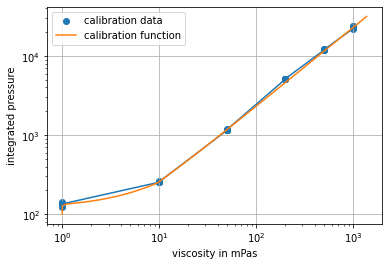

In [13]:
## fit a model through calibration curves

aspirate_integrals = [point.viscosity_proxy_result.pressure_integral_aspirate for point in viscosity_calibration.points]
aspirate_integrals = np.abs(np.array(aspirate_integrals))
standard_viscosities = [point.standard_viscosity_mPas for point in viscosity_calibration.points]

valid_aspirate_integrals = [point.viscosity_proxy_result.pressure_integral_aspirate for point in viscosity_calibration.points if point.standard_viscosity_mPas>5]
valid_aspirate_integrals = np.abs(np.array(valid_aspirate_integrals))

aspirate_integral_1000 = np.abs(np.mean([point.viscosity_proxy_result.pressure_integral_aspirate for point in viscosity_calibration.points if point.standard_viscosity_mPas>950 and point.standard_viscosity_mPas<1100]))
aspirate_integral_10 = np.abs(np.mean([point.viscosity_proxy_result.pressure_integral_aspirate for point in viscosity_calibration.points if point.standard_viscosity_mPas>5 and point.standard_viscosity_mPas<15]))
low_aspirate_integral = np.abs(np.mean([point.viscosity_proxy_result.pressure_integral_aspirate for point in viscosity_calibration.points if point.standard_viscosity_mPas<5]))

valid_standard_viscosities = [point.standard_viscosity_mPas for point in viscosity_calibration.points if point.standard_viscosity_mPas>5]

[m,b] = np.polyfit(valid_standard_viscosities, valid_aspirate_integrals,1)

def viscosity_from_integral(aspirate_integral):
    aspirate_integral = np.abs(aspirate_integral)  ## if someone forgets the - sign..
    if aspirate_integral > min(valid_aspirate_integrals): 
        ## using the whole fit results in a discontinuity at 10 mPas
        return 10+990*(aspirate_integral-aspirate_integral_10)/(aspirate_integral_1000-aspirate_integral_10)
    
    if aspirate_integral <= min(valid_aspirate_integrals) and aspirate_integral > low_aspirate_integral:
        return 1+(aspirate_integral-low_aspirate_integral)/(min(valid_aspirate_integrals)-low_aspirate_integral)*9
    else:
        return 1
viscosity_from_integral = np.frompyfunc(viscosity_from_integral,1, 1)    

aspirate_integral_list = 10**np.linspace(2,4.5,100)


fig, ax = plt.subplots()
ax.scatter(standard_viscosities, aspirate_integrals, label = "calibration data")
ax.plot(standard_viscosities, aspirate_integrals)

viscosity_list = 10**np.linspace(-0.5, 3.5)
ax.plot(viscosity_from_integral(aspirate_integral_list), aspirate_integral_list, label = "calibration function")

ax.set_xscale("log")
ax.set_yscale("log")

ax.set_xlabel("viscosity in mPas")
ax.set_ylabel("integrated pressure")
ax.legend()

ax.grid(True)


In [14]:
class SoapExperiment(BaseModel):
    input_soap_fraction: Optional[float] = Field(default = None, description="fraction of soap in the input mix")
    observed_soap_input_viscosity: Optional[float]
    impure_soap_fraction: float
    mix_viscosity: float

class SoapExperimentSeries(BaseModel):
    experiments: list[SoapExperiment] = Field(default = [])

## test single iteration of model building routine
if False:
    experiment_series = SoapExperimentSeries()
else:
    with open("data/input_output_characterized_soap_mixing_data.json") as f:
        experiment_series = SoapExperimentSeries.parse_obj(json.load(f))
    

if False:
    mix_well = 16
    target_well = 17
    input_soap_fraction = 0.9
    impure_soap_fraction = 0.5
    prepare_mix(n_well=mix_well, 
                material_fraction = input_soap_fraction, 
                water_fraction = 1-input_soap_fraction,
                total_volume_ul = 250 ## a bit more, for the case much is needed for final mix.
               )

    ## mix and measuere (recycling) input
    input_characterization = mix_and_measure(mix_well)

    ## with diluted material as origin
    prepare_mix(n_well=target_well, 
                material_origin_location = plate.wells()[mix_well].bottom(z=1), 
                material_pipette_well = tiprack.wells()[mix_well],
                material_fraction = impure_soap_fraction,
                water_fraction = 1-impure_soap_fraction)

    ## mix and measure (recycling) output
    output_characterization = mix_and_measure(target_well)
    
    print("input_characterization:", input_characterization)
    print("output_characterization:", output_characterization)
        
    iteration_experiment = SoapExperiment(input_soap_fraction = input_soap_fraction,
                                   observed_soap_input_viscosity = viscosity_from_integral(input_characterization.pressure_integral_aspirate),
                                   impure_soap_fraction = impure_soap_fraction,
                                   mix_viscosity = viscosity_from_integral(output_characterization.pressure_integral_aspirate),
                                )
    
    experiment_series.experiments.append(iteration_experiment)
        # save the experimental data: 
    with open("data/input_output_characterized_soap_mixing_data.json", 'w') as f:
        json.dump(experiment_series.dict(), f)
        
    
    

# Build a (recycling) Process database 
* the database will map from input characterization to output characterization using process parameters.

In [66]:
from ax.service.ax_client import AxClient, ObjectiveProperties
from ax.service.utils.instantiation import FixedFeatures

from ax.modelbridge.factory import Models
from ax.modelbridge.generation_strategy import GenerationStep, GenerationStrategy

from ax.plot.slice import plot_slice
from ax.plot.contour import plot_contour
from ax.utils.notebook.plotting import render

from ax.core.observation import ObservationFeatures

from botorch.acquisition import UpperConfidenceBound
from pydantic import BaseModel, Field
from typing import Optional

import json

import time

In [ ]:
## do the model-building part of the Bayesian optimization (if not already done):

n_explore = 30

gs = GenerationStrategy(
    steps=[
        GenerationStep(
            model=Models.SOBOL,
            num_trials=n_explore,  # during exploration, we want to explore the input space
            min_trials_observed=3,
            max_parallelism=1,
            model_kwargs={"seed": 999},
        ),
        GenerationStep(
            model=Models.BOTORCH_MODULAR,
            num_trials=-1,
            max_parallelism=3
        ),
    ]
)


ax_client = AxClient(generation_strategy=gs)

print("created ax client experiment")
ax_client.create_experiment(
    parameters=[
        {"name": "input_soap_fraction", "type": "range", "bounds": [0.6, 1.0]}, # limit input impurity to high values
        {"name": "impure_soap_fraction", "type": "range", "bounds": [0.0, 1.0]}
        # since exploration is the only point of this phase. (maybe one might come up with a target function that
        # also takes good distributions of the measured quantities into account)
    ],
    objectives={
        "target_deviation": ObjectiveProperties(minimize=True)
    },
)


if False:
    experiment_series = SoapExperimentSeries()
else:
    ## read present data
    with open("data/input_output_characterized_soap_mixing_data_001.json") as f:
        experiment_series = SoapExperimentSeries.parse_obj(json.load(f))
    

print("make experiment explore possible input space, measure all relevant values")
n_start = len(experiment_series.experiments)
for i in range(n_explore):
    n_offset = 4
    mix_well = 2*i+n_offset
    target_well = 2*i + 1 + n_offset
    
    parameterization, trial_index = ax_client.get_next_trial()
    
    #only execute experiment if index is not in database (this condition should be replaced by initialization from loaded data):
    if i>=n_start:

        ## prepare input mix and characterize it:
        input_soap_fraction = parameterization["input_soap_fraction"]

        prepare_mix(n_well=mix_well, 
                    material_fraction = input_soap_fraction, 
                    water_fraction = 1-input_soap_fraction,
                    total_volume_ul = 250 ## a bit more, for the case much is needed for final mix.
                   )

        input_characterization = mix_and_measure(mix_well)

        ## do the proxy experiment 
        impure_soap_fraction = parameterization["impure_soap_fraction"]

        prepare_mix(n_well=target_well, 
                    material_origin_location = plate.wells()[mix_well].bottom(z=1), 
                    material_pipette_well = tiprack.wells()[mix_well],
                    material_fraction = impure_soap_fraction,
                    water_fraction = 1-impure_soap_fraction)

        ## mix and measure (recycling) output
        output_characterization = mix_and_measure(target_well)

        print("input_characterization:", input_characterization)
        print("output_characterization:", output_characterization)
        ## add data to database
        iteration_experiment = SoapExperiment(input_soap_fraction = input_soap_fraction,
                                       observed_soap_input_viscosity = viscosity_from_integral(input_characterization.pressure_integral_aspirate),
                                       impure_soap_fraction = impure_soap_fraction,
                                       mix_viscosity = viscosity_from_integral(output_characterization.pressure_integral_aspirate),
                                    )

        experiment_series.experiments.append(iteration_experiment)
        # save the experimental data: 
        with open("data/input_output_characterized_soap_mixing_data_001.json", 'w') as f:
            json.dump(experiment_series.dict(), f)
        
    # complete the ax trial (this has actually no effect. one might add a target function here, that includes measured viscosities into sampling strategy)
    ax_client.complete_trial(trial_index=i, raw_data=1)

[INFO 02-06 03:01:19] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 02-06 03:01:19] ax.service.utils.instantiation: Inferred value type of ParameterType.FLOAT for parameter input_soap_fraction. If that is not the expected value type, you can explicitly specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 02-06 03:01:19] ax.service.utils.instantiation: Inferred value type of ParameterType.FLOAT for parameter impure_soap_fraction. If that is not the expected value type, you can explicitly specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 02-06 03:01:19] ax.service.utils.instantiation: Created search space: SearchSpace(parameters=[RangeParameter(name='input_soap_fraction', parameter_type=FLOAT, range=[0.6, 1.0]), RangeParameter(name='impure_soap_fraction', parameter_type=FLO

created ax client experiment
make experiment explore possible input space, measure all relevant values


/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/ax/modelbridge/cross_validation.py:463: UserWarning:

Encountered exception in computing model fit quality: RandomModelBridge does not support prediction.

[INFO 02-06 03:01:19] ax.service.ax_client: Generated new trial 1 with parameters {'input_soap_fraction': 0.773953, 'impure_soap_fraction': 0.396266} using model Sobol.
[INFO 02-06 03:01:19] ax.service.ax_client: Completed trial 1 with data: {'target_deviation': (1, None)}.
/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/ax/modelbridge/cross_validation.py:463: UserWarning:

Encountered exception in computing model fit quality: RandomModelBridge does not support prediction.

[INFO 02-06 03:01:19] ax.service.ax_client: Generated new trial 2 with parameters {'input_soap_fraction': 0.630258, 'impure_soap_fraction': 0.934926} using model Sobol.
[INFO 02-06 03:01:19] ax.service.ax_client: Completed trial 2 with data: {'target_deviation': (1, None)}.
/var/lib/jupyter/m

transfer 166.24590577557683 ul material to well 24
aspiration target:  166.24590577557683  ul
aspirated. wait for settling
finally aspirated  160.8704963531345  ul
transfer 83.75409422442317 ul water to well 24
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 65
    # data points      = 635
    # variables        = 3
    chi-square         = 404039.333
    reduced chi-square = 639.302743
    Akaike info crit   = 4105.33300
    Bayesian info crit = 4118.69387
    R-squared          = 0.94947530
[[Variables]]
    a:   -1219.28291 +/- 14.8354091 (1.22%) (init = -500)
    tau:  0.15408903 +/- 0.00278472 (1.81%) (init = 0.01)
    c:   -225.896598 +/- 1.03606654 (0.46%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6567
    C(tau, c) = +0.1795
[[Model]]
    Model(exponential_curve)
[[

/tmp/ipykernel_86364/482103229.py:353: RuntimeWarning:

divide by zero encountered in true_divide

/tmp/ipykernel_86364/482103229.py:389: RuntimeWarning:

divide by zero encountered in true_divide



input_characterization: raw_data=[MeasurementPoint(seconds_since_start=0.041834115982055664, utc_timestamp='2025-02-06 03:04:47.519216', pressure_au=-29.626861572265625, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.08349442481994629, utc_timestamp='2025-02-06 03:04:47.560874', pressure_au=-30.047561645507812, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.12270855903625488, utc_timestamp='2025-02-06 03:04:47.600087', pressure_au=-29.6474609375, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.13747668266296387, utc_timestamp='2025-02-06 03:04:47.614855', pressure_au=-29.81024169921875, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.1544344425201416, utc_timestamp='2025-02-06 03:04:47.631814', pressure_au=-30.038742065429688, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.17702507972717285, utc_timestamp='2025-02-06 03:04:47.654405', 

[INFO 02-06 03:09:09] ax.service.ax_client: Completed trial 10 with data: {'target_deviation': (1, None)}.
/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/ax/modelbridge/cross_validation.py:463: UserWarning:

Encountered exception in computing model fit quality: RandomModelBridge does not support prediction.

[INFO 02-06 03:09:09] ax.service.ax_client: Generated new trial 11 with parameters {'input_soap_fraction': 0.95971, 'impure_soap_fraction': 0.478412} using model Sobol.


transfer 239.92760125547647 ul material to well 26
aspiration target:  239.92760125547647  ul
aspirated. wait for settling
finally aspirated  177.0  ul
aspiration target:  62.927601255476475  ul
aspirated. wait for settling
finally aspirated  60.22036138102412  ul
transfer 10.072398744523536 ul water to well 26
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  6.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 37
    # data points      = 641
    # variables        = 3
    chi-square         = 172896.094
    reduced chi-square = 270.997013
    Akaike info crit   = 3593.94406
    Bayesian info crit = 3607.33314
    R-squared          = 0.99953529
[[Variables]]
    a:   -3638.94781 +/- 8.99347972 (0.25%) (init = -500)
    tau:  7.50146444 +/- 0.03876524 (0.52%) (init = 0.01)
    c:   -1150.72222 +/- 10.2555622 (0.89%) (init = 0)
[[Correlations]] (unreported correlations a

/tmp/ipykernel_86364/482103229.py:353: RuntimeWarning:

divide by zero encountered in true_divide

/tmp/ipykernel_86364/482103229.py:389: RuntimeWarning:

divide by zero encountered in true_divide



transfer 95.68237941712141 ul material to well 27
aspiration target:  95.68237941712141  ul
aspirated. wait for settling
finally aspirated  81.25061735883355  ul
aspiration target:  14.431762058287859  ul
aspirated. wait for settling
finally aspirated  14.874938264116645  ul
transfer 104.31762058287859 ul water to well 27
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 632
    # variables        = 3
    chi-square         = 5696.95648
    reduced chi-square = 9.05716452
    Akaike info crit   = 1395.64031
    Bayesian info crit = 1408.98698
    R-squared          = 0.99232749
[[Variables]]
    a:   -636.700884 +/- 2.69931897 (0.42%) (init = -500)
    tau:  0.03793118 +/- 2.7394e-04 (0.72%) (init = 0.01)
    c:   -217.397743 +/- 0.12066208 (0.06%) (init = 0)
[[Correlations]] (unreported co

/usr/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning:

Mean of empty slice.

/usr/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning:

invalid value encountered in double_scalars



input_characterization: raw_data=[MeasurementPoint(seconds_since_start=0.06329965591430664, utc_timestamp='2025-02-06 03:14:01.378712', pressure_au=-292.01947021484375, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.09933662414550781, utc_timestamp='2025-02-06 03:14:01.414746', pressure_au=-291.5271911621094, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.11953067779541016, utc_timestamp='2025-02-06 03:14:01.434940', pressure_au=-290.5994567871094, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.14092111587524414, utc_timestamp='2025-02-06 03:14:01.456331', pressure_au=-290.166015625, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.16016602516174316, utc_timestamp='2025-02-06 03:14:01.475576', pressure_au=-290.1699523925781, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.17821311950683594, utc_timestamp='2025-02-06 03:14:01.493623', pr

[INFO 02-06 03:19:51] ax.service.ax_client: Completed trial 11 with data: {'target_deviation': (1, None)}.
/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/ax/modelbridge/cross_validation.py:463: UserWarning:

Encountered exception in computing model fit quality: RandomModelBridge does not support prediction.

[INFO 02-06 03:19:51] ax.service.ax_client: Generated new trial 12 with parameters {'input_soap_fraction': 0.923392, 'impure_soap_fraction': 0.740202} using model Sobol.


transfer 230.84807293489575 ul material to well 28
aspiration target:  230.84807293489575  ul
aspirated. wait for settling
finally aspirated  177.0  ul
aspiration target:  53.848072934895754  ul
aspirated. wait for settling
finally aspirated  52.232880228385326  ul
transfer 19.15192706510424 ul water to well 28
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  5.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 37
    # data points      = 640
    # variables        = 3
    chi-square         = 172392.897
    reduced chi-square = 270.632491
    Akaike info crit   = 3587.48048
    Bayesian info crit = 3600.86489
    R-squared          = 0.99950378
[[Variables]]
    a:   -3532.35390 +/- 9.29901567 (0.26%) (init = -500)
    tau:  7.62200973 +/- 0.04142019 (0.54%) (init = 0.01)
    c:   -1239.98300 +/- 10.5621765 (0.85%) (init = 0)
[[Correlations]] (unreported correlations a

/tmp/ipykernel_86364/482103229.py:353: RuntimeWarning:

divide by zero encountered in true_divide

/tmp/ipykernel_86364/482103229.py:389: RuntimeWarning:

divide by zero encountered in true_divide



transfer 148.04036561399698 ul material to well 29
aspiration target:  148.04036561399698  ul
aspirated. wait for settling
finally aspirated  126.84440217539668  ul
aspiration target:  21.1959634386003  ul
aspirated. wait for settling
finally aspirated  19.315559782460333  ul
transfer 51.95963438600302 ul water to well 29
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 632
    # variables        = 3
    chi-square         = 2599687.34
    reduced chi-square = 4133.04824
    Akaike info crit   = 5265.51180
    Bayesian info crit = 5278.85847
    R-squared          = 0.98763816
[[Variables]]
    a:   -2292.39321 +/- 11.0817435 (0.48%) (init = -500)
    tau:  2.10964520 +/- 0.02289844 (1.09%) (init = 0.01)
    c:   -265.359911 +/- 5.27054643 (1.99%) (init = 0)
[[Correlations]] (unreported co

/tmp/ipykernel_86364/482103229.py:353: RuntimeWarning:

divide by zero encountered in true_divide

/tmp/ipykernel_86364/482103229.py:389: RuntimeWarning:

divide by zero encountered in true_divide



input_characterization: raw_data=[MeasurementPoint(seconds_since_start=0.04319477081298828, utc_timestamp='2025-02-06 03:24:43.702771', pressure_au=-256.94598388671875, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.09485054016113281, utc_timestamp='2025-02-06 03:24:43.754424', pressure_au=-256.144775390625, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.11921167373657227, utc_timestamp='2025-02-06 03:24:43.778786', pressure_au=-255.7221221923828, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.1349809169769287, utc_timestamp='2025-02-06 03:24:43.794556', pressure_au=-255.40733337402344, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.15513014793395996, utc_timestamp='2025-02-06 03:24:43.814705', pressure_au=-254.74342346191406, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.17284703254699707, utc_timestamp='2025-02-06 03:24:43.832422'

[INFO 02-06 03:30:32] ax.service.ax_client: Completed trial 12 with data: {'target_deviation': (1, None)}.
/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/ax/modelbridge/cross_validation.py:463: UserWarning:

Encountered exception in computing model fit quality: RandomModelBridge does not support prediction.

[INFO 02-06 03:30:32] ax.service.ax_client: Generated new trial 13 with parameters {'input_soap_fraction': 0.602103, 'impure_soap_fraction': 0.358504} using model Sobol.


transfer 150.52575189620256 ul material to well 30
aspiration target:  150.52575189620256  ul
aspirated. wait for settling
finally aspirated  144.57832708582282  ul
transfer 99.47424810379744 ul water to well 30
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33
    # data points      = 635
    # variables        = 3
    chi-square         = 9444.38550
    reduced chi-square = 14.9436479
    Akaike info crit   = 1720.21471
    Bayesian info crit = 1733.57558
    R-squared          = 0.99190050
[[Variables]]
    a:   -730.374577 +/- 3.21701564 (0.44%) (init = -500)
    tau:  0.05025340 +/- 3.7287e-04 (0.74%) (init = 0.01)
    c:   -206.316895 +/- 0.15494891 (0.08%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.5779
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # 

/usr/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning:

Mean of empty slice.

/usr/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning:

invalid value encountered in double_scalars

/tmp/ipykernel_86364/482103229.py:379: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



transfer 71.70079108327627 ul material to well 31
aspiration target:  71.70079108327627  ul
aspirated. wait for settling
finally aspirated  78.8708701916039  ul
transfer 128.29920891672373 ul water to well 31
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 17
    # data points      = 638
    # variables        = 3
    chi-square         = 4177.30234
    reduced chi-square = 6.57842888
    Akaike info crit   = 1204.85474
    Bayesian info crit = 1218.22975
    R-squared          = 0.41775410
##  Warning: uncertainties could not be estimated:
[[Variables]]
    a:   -54.7892956 (init = -500)
    tau:  3.7282e-04 (init = 0.01)
    c:   -209.064495 (init = 0)
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 21
    # data points      = 642
    # variables 

/tmp/ipykernel_86364/482103229.py:353: RuntimeWarning:

divide by zero encountered in true_divide

/tmp/ipykernel_86364/482103229.py:389: RuntimeWarning:

divide by zero encountered in true_divide



input_characterization: raw_data=[MeasurementPoint(seconds_since_start=0.03312802314758301, utc_timestamp='2025-02-06 03:33:52.290075', pressure_au=-4.30511474609375, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.05577349662780762, utc_timestamp='2025-02-06 03:33:52.312722', pressure_au=-4.4326019287109375, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.08898472785949707, utc_timestamp='2025-02-06 03:33:52.345932', pressure_au=-4.6405029296875, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.10522794723510742, utc_timestamp='2025-02-06 03:33:52.362175', pressure_au=-4.4188690185546875, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.13259053230285645, utc_timestamp='2025-02-06 03:33:52.389537', pressure_au=-4.5071258544921875, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.14904356002807617, utc_timestamp='2025-02-06 03:33:52.405990',

[INFO 02-06 03:38:14] ax.service.ax_client: Completed trial 13 with data: {'target_deviation': (1, None)}.
/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/ax/modelbridge/cross_validation.py:463: UserWarning:

Encountered exception in computing model fit quality: RandomModelBridge does not support prediction.

[INFO 02-06 03:38:14] ax.service.ax_client: Generated new trial 14 with parameters {'input_soap_fraction': 0.79581, 'impure_soap_fraction': 0.819825} using model Sobol.


transfer 198.95243858918548 ul material to well 32
aspiration target:  198.95243858918548  ul
aspirated. wait for settling
finally aspirated  177.0  ul
aspiration target:  21.952438589185476  ul
aspirated. wait for settling
finally aspirated  23.147682448104025  ul
transfer 51.04756141081451 ul water to well 32
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 645
    # variables        = 3
    chi-square         = 4374475.93
    reduced chi-square = 6813.82543
    Akaike info crit   = 5696.22029
    Bayesian info crit = 5709.62804
    R-squared          = 0.99053278
[[Variables]]
    a:   -3285.59329 +/- 13.1308256 (0.40%) (init = -500)
    tau:  3.59424159 +/- 0.04537202 (1.26%) (init = 0.01)
    c:   -755.665260 +/- 13.6673452 (1.81%) (init = 0)
[[Correlations]] (unreported correlations 

/tmp/ipykernel_86364/482103229.py:353: RuntimeWarning:

divide by zero encountered in true_divide

/tmp/ipykernel_86364/482103229.py:389: RuntimeWarning:

divide by zero encountered in true_divide



transfer 163.96494638174772 ul material to well 33
aspiration target:  163.96494638174772  ul
aspirated. wait for settling
finally aspirated  173.3614410199225  ul
transfer 36.03505361825228 ul water to well 33
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 53
    # data points      = 641
    # variables        = 3
    chi-square         = 3020218.97
    reduced chi-square = 4733.88553
    Akaike info crit   = 5427.45649
    Bayesian info crit = 5440.84558
    R-squared          = 0.98088476
[[Variables]]
    a:   -3119.44826 +/- 22.8594084 (0.73%) (init = -500)
    tau:  0.53561867 +/- 0.00594406 (1.11%) (init = 0.01)
    c:   -262.488005 +/- 3.06856641 (1.17%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6567
    C(tau, c) = +0.3448
[[Model]]
    Model(exponential_curve)
[[

/tmp/ipykernel_86364/482103229.py:353: RuntimeWarning:

divide by zero encountered in true_divide

/tmp/ipykernel_86364/482103229.py:389: RuntimeWarning:

divide by zero encountered in true_divide



input_characterization: raw_data=[MeasurementPoint(seconds_since_start=0.06311225891113281, utc_timestamp='2025-02-06 03:43:03.834243', pressure_au=-62.88905334472656, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.07922554016113281, utc_timestamp='2025-02-06 03:43:03.850355', pressure_au=-63.05674743652344, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.10620379447937012, utc_timestamp='2025-02-06 03:43:03.877334', pressure_au=-62.4742431640625, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.1299891471862793, utc_timestamp='2025-02-06 03:43:03.901119', pressure_au=-61.61614990234375, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.15329957008361816, utc_timestamp='2025-02-06 03:43:03.924429', pressure_au=-61.23075866699219, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.1795954704284668, utc_timestamp='2025-02-06 03:43:03.950724', pr

[INFO 02-06 03:47:25] ax.service.ax_client: Completed trial 14 with data: {'target_deviation': (1, None)}.
/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/ax/modelbridge/cross_validation.py:463: UserWarning:

Encountered exception in computing model fit quality: RandomModelBridge does not support prediction.

[INFO 02-06 03:47:26] ax.service.ax_client: Generated new trial 15 with parameters {'input_soap_fraction': 0.879598, 'impure_soap_fraction': 0.216236} using model Sobol.


transfer 219.89956498146057 ul material to well 34
aspiration target:  219.89956498146057  ul
aspirated. wait for settling
finally aspirated  183.0  ul
aspiration target:  36.89956498146057  ul
aspirated. wait for settling
finally aspirated  34.58952147960663  ul
transfer 30.10043501853943 ul water to well 34
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  5.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 37
    # data points      = 630
    # variables        = 3
    chi-square         = 254497.635
    reduced chi-square = 405.897345
    Akaike info crit   = 3786.83601
    Bayesian info crit = 3800.17317
    R-squared          = 0.99924924
[[Variables]]
    a:   -3391.98464 +/- 9.79504878 (0.29%) (init = -500)
    tau:  7.07208877 +/- 0.04448723 (0.63%) (init = 0.01)
    c:   -1351.62090 +/- 11.2859365 (0.83%) (init = 0)
[[Correlations]] (unreported correlations are

/tmp/ipykernel_86364/482103229.py:353: RuntimeWarning:

divide by zero encountered in true_divide

/tmp/ipykernel_86364/482103229.py:389: RuntimeWarning:

divide by zero encountered in true_divide



transfer 43.247212655842304 ul material to well 35
aspiration target:  43.247212655842304  ul
aspirated. wait for settling
finally aspirated  36.571933921426535  ul
transfer 156.7527873441577 ul water to well 35
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 21
    # data points      = 645
    # variables        = 3
    chi-square         = 4543.78314
    reduced chi-square = 7.07754383
    Akaike info crit   = 1265.21087
    Bayesian info crit = 1278.61862
    R-squared          = 0.05064614
##  Warning: uncertainties could not be estimated:
[[Variables]]
    a:   -15.5813409 (init = -500)
    tau:  3.9127e-04 (init = 0.01)
    c:   -211.842715 (init = 0)
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 21
    # data points      = 637
    # variabl

/tmp/ipykernel_86364/482103229.py:353: RuntimeWarning:

divide by zero encountered in true_divide

/tmp/ipykernel_86364/482103229.py:389: RuntimeWarning:

divide by zero encountered in true_divide



input_characterization: raw_data=[MeasurementPoint(seconds_since_start=0.0582730770111084, utc_timestamp='2025-02-06 03:52:16.381069', pressure_au=-247.7179412841797, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.08236813545227051, utc_timestamp='2025-02-06 03:52:16.405161', pressure_au=-247.3678436279297, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.10022306442260742, utc_timestamp='2025-02-06 03:52:16.423016', pressure_au=-247.2589874267578, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.11905145645141602, utc_timestamp='2025-02-06 03:52:16.441844', pressure_au=-247.13050842285156, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.13930726051330566, utc_timestamp='2025-02-06 03:52:16.462104', pressure_au=-246.688232421875, mode=<ModeEnum.aspirate: 'aspirate'>), MeasurementPoint(seconds_since_start=0.16555356979370117, utc_timestamp='2025-02-06 03:52:16.488347', 

[INFO 02-06 03:56:38] ax.service.ax_client: Completed trial 15 with data: {'target_deviation': (1, None)}.
/var/lib/jupyter/matthias_venv/lib/python3.10/site-packages/ax/modelbridge/cross_validation.py:463: UserWarning:

Encountered exception in computing model fit quality: RandomModelBridge does not support prediction.

[INFO 02-06 03:56:38] ax.service.ax_client: Generated new trial 16 with parameters {'input_soap_fraction': 0.88958, 'impure_soap_fraction': 0.863208} using model Sobol.


transfer 222.39499147981405 ul material to well 36
aspiration target:  222.39499147981405  ul
aspirated. wait for settling
finally aspirated  183.0  ul
aspiration target:  39.39499147981405  ul
aspirated. wait for settling
finally aspirated  40.33449062779546  ul
transfer 27.605008520185937 ul water to well 36
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  6.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 37
    # data points      = 633
    # variables        = 3
    chi-square         = 244570.535
    reduced chi-square = 388.207198
    Akaike info crit   = 3776.64719
    Bayesian info crit = 3789.99860
    R-squared          = 0.99929420
[[Variables]]
    a:   -3405.49211 +/- 9.35066989 (0.27%) (init = -500)
    tau:  7.00662483 +/- 0.04222152 (0.60%) (init = 0.01)
    c:   -1353.47215 +/- 10.7912815 (0.80%) (init = 0)
[[Correlations]] (unreported correlations ar

/tmp/ipykernel_86364/482103229.py:353: RuntimeWarning:

divide by zero encountered in true_divide

/tmp/ipykernel_86364/482103229.py:389: RuntimeWarning:

divide by zero encountered in true_divide



transfer 172.64150604605675 ul material to well 37
aspiration target:  172.64150604605675  ul
aspirated. wait for settling
finally aspirated  155.90565665066242  ul


In [34]:
if False:
    experiment_series = SoapExperimentSeries()
else:
    with open("data/input_output_characterized_soap_mixing_data_001.json") as f:
        experiment_series = SoapExperimentSeries.parse_obj(json.load(f))
    

In [35]:
print(len(experiment_series.experiments))

30


# Production Optimization
* this phase corresponds to expensive production runs, where parameters cannot be easily changed -> we want good results after as few iterations as possible 
* concept: do measurement on input and use it to fix the measured feature within our previously built model. 

In [53]:
target_viscosity = 100
recycling_input_well = raw_material_plate.wells()[2] 

In [54]:
## intialize the model with previous knwoledge and target function
finetune_strategy = GenerationStrategy(
    steps=[
        GenerationStep(
            model=Models.BOTORCH_MODULAR,
            num_trials=-1,
            max_parallelism=1,
            model_kwargs={"botorch_acqf_class": UpperConfidenceBound}
        ),
    ]
)
finetune_ax_client = AxClient(generation_strategy=finetune_strategy)

print("created ax client experiment")
finetune_ax_client.create_experiment(
    parameters=[
        {"name": "input_soap_viscosity", "type": "range", "bounds": [0.0, 3000.0]},# will be fixed measured
        # feature, which has to be contained in the model.
        {"name": "impure_soap_fraction", "type": "range", "bounds": [0.0, 1.0]}
        # this will be varied to reach the necessary target.
    ],
    objectives={
        "target_deviation": ObjectiveProperties(minimize=True)
    },
)

## define objective function:
def target_deviation( measured_viscosity, target_viscosity = target_viscosity):
    return (np.log(measured_viscosity) - np.log(target_viscosity))**2 
## initialize model with known data:
for i, experiment in enumerate(experiment_series.experiments):
    finetune_ax_client.attach_trial(
        {"input_soap_viscosity": experiment.observed_soap_input_viscosity,
         "impure_soap_fraction": experiment.impure_soap_fraction}
    )
    cost_value = target_deviation(experiment.mix_viscosity)
    finetune_ax_client.complete_trial(trial_index=i, raw_data=cost_value)


[INFO 02-07 03:09:07] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 02-07 03:09:07] ax.service.utils.instantiation: Inferred value type of ParameterType.FLOAT for parameter input_soap_viscosity. If that is not the expected value type, you can explicitly specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 02-07 03:09:07] ax.service.utils.instantiation: Inferred value type of ParameterType.FLOAT for parameter impure_soap_fraction. If that is not the expected value type, you can explicitly specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 02-07 03:09:07] ax.service.utils.instantiation: Created search space: SearchSpace(parameters=[RangeParameter(name='input_soap_viscosity', parameter_type=FLOAT, range=[0.0, 3000.0]), RangeParameter(name='impure_soap_fraction', parameter_typ

created ax client experiment


[INFO 02-07 03:09:07] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 10.24815, 'impure_soap_fraction': 0.934926}] as trial 2.
[INFO 02-07 03:09:08] ax.service.ax_client: Completed trial 2 with data: {'target_deviation': (4.543905, None)}.
[INFO 02-07 03:09:08] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 1391.228645, 'impure_soap_fraction': 0.038764}] as trial 3.
[INFO 02-07 03:09:08] ax.service.ax_client: Completed trial 3 with data: {'target_deviation': (21.207592, None)}.
[INFO 02-07 03:09:08] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 1402.979126, 'impure_soap_fraction': 0.808236}] as trial 4.
[INFO 02-07 03:09:08] ax.service.ax_client: Completed trial 4 with data: {'target_deviation': (2.442966, None)}.
[INFO 02-07 03:09:08] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 93.474984, 'impure_soap_fraction': 0.157526}] as trial 5.
[INFO 02-07 03:09

[INFO 02-07 03:09:10] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 702.869439, 'impure_soap_fraction': 0.934868}] as trial 32.
[INFO 02-07 03:09:10] ax.service.ax_client: Completed trial 32 with data: {'target_deviation': (1.396117, None)}.
[INFO 02-07 03:09:10] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 654.647455, 'impure_soap_fraction': 0.959656}] as trial 33.
[INFO 02-07 03:09:10] ax.service.ax_client: Completed trial 33 with data: {'target_deviation': (1.915068, None)}.
[INFO 02-07 03:09:10] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 711.821239, 'impure_soap_fraction': 0.910097}] as trial 34.
[INFO 02-07 03:09:10] ax.service.ax_client: Completed trial 34 with data: {'target_deviation': (0.317459, None)}.
[INFO 02-07 03:09:10] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 641.013977, 'impure_soap_fraction': 0.941903}] as trial 35.
[INFO 02-0

In [50]:
## fit model to data:
print("start fitting the model")
finetune_ax_client.fit_model()
print("model finally fitted")
## plot a slice of the model: 



start fitting the model
model finally fitted


In [51]:
## what if the input soap viscosity is higher than the target value? 
model = finetune_ax_client.generation_strategy.model
for possible_input_viscosity in [100,1000,3000]:
    render(plot_slice(model, param_name = "impure_soap_fraction" ,metric_name = "target_deviation",
               slice_values={"input_soap_viscosity": possible_input_viscosity}))
    render(plot_contour(model, param_x = "impure_soap_fraction", param_y = "input_soap_viscosity", metric_name =
        "target_deviation"))

In [55]:
## another model that maps from inputs to viscosity rather than error: 
## intialize the model mapping from input viscosity to output viscosity (instead of error)
viscosity_strategy = GenerationStrategy(
    steps=[
        GenerationStep(
            model=Models.BOTORCH_MODULAR,
            num_trials=-1,
            max_parallelism=1,
        ),
    ]
)
viscosity_ax_client = AxClient(generation_strategy=viscosity_strategy)

print("created ax client experiment")
viscosity_ax_client.create_experiment(
    parameters=[
        {"name": "input_soap_viscosity", "type": "range", "bounds": [0.0, 3000.0]},# will be fixed measured
        # feature, which has to be contained in the model.
        {"name": "impure_soap_fraction", "type": "range", "bounds": [0.0, 1.0]}
        # this will be varied to reach the necessary target.
    ],
    objectives={
        "viscosity": ObjectiveProperties(minimize=False)
    },
)

## initialize model with known data:
for i, experiment in enumerate(experiment_series.experiments):
    
    viscosity_ax_client.attach_trial(
        {"input_soap_viscosity": experiment.observed_soap_input_viscosity,
         "impure_soap_fraction": experiment.impure_soap_fraction}
    )
    viscosity_ax_client.complete_trial(trial_index=i, raw_data=experiment.mix_viscosity)


[INFO 02-07 03:09:36] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 02-07 03:09:36] ax.service.utils.instantiation: Inferred value type of ParameterType.FLOAT for parameter input_soap_viscosity. If that is not the expected value type, you can explicitly specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 02-07 03:09:36] ax.service.utils.instantiation: Inferred value type of ParameterType.FLOAT for parameter impure_soap_fraction. If that is not the expected value type, you can explicitly specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 02-07 03:09:36] ax.service.utils.instantiation: Created search space: SearchSpace(parameters=[RangeParameter(name='input_soap_viscosity', parameter_type=FLOAT, range=[0.0, 3000.0]), RangeParameter(name='impure_soap_fraction', parameter_typ

created ax client experiment


[INFO 02-07 03:09:36] ax.service.ax_client: Completed trial 2 with data: {'viscosity': (11.864211, None)}.
[INFO 02-07 03:09:36] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 1391.228645, 'impure_soap_fraction': 0.038764}] as trial 3.
[INFO 02-07 03:09:36] ax.service.ax_client: Completed trial 3 with data: {'viscosity': (1.0, None)}.
[INFO 02-07 03:09:36] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 1402.979126, 'impure_soap_fraction': 0.808236}] as trial 4.
[INFO 02-07 03:09:36] ax.service.ax_client: Completed trial 4 with data: {'viscosity': (477.311482, None)}.
[INFO 02-07 03:09:36] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 93.474984, 'impure_soap_fraction': 0.157526}] as trial 5.
[INFO 02-07 03:09:36] ax.service.ax_client: Completed trial 5 with data: {'viscosity': (1.0, None)}.
[INFO 02-07 03:09:36] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity

[INFO 02-07 03:09:39] ax.service.ax_client: Completed trial 33 with data: {'viscosity': (399.027401, None)}.
[INFO 02-07 03:09:39] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 711.821239, 'impure_soap_fraction': 0.910097}] as trial 34.
[INFO 02-07 03:09:39] ax.service.ax_client: Completed trial 34 with data: {'viscosity': (175.669588, None)}.
[INFO 02-07 03:09:39] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 641.013977, 'impure_soap_fraction': 0.941903}] as trial 35.
[INFO 02-07 03:09:39] ax.service.ax_client: Completed trial 35 with data: {'viscosity': (366.548981, None)}.
[INFO 02-07 03:09:39] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 616.602402, 'impure_soap_fraction': 0.952637}] as trial 36.
[INFO 02-07 03:09:39] ax.service.ax_client: Completed trial 36 with data: {'viscosity': (335.388626, None)}.
[INFO 02-07 03:09:39] ax.core.experiment: Attached custom parameterizations [{

In [47]:
viscosity_ax_client.fit_model()

In [48]:
## what if the input soap viscosity is higher than the target value? 
model = viscosity_ax_client.generation_strategy.model
for possible_input_viscosity in [100,1000,3000]:
    render(plot_slice(model, param_name = "impure_soap_fraction" ,metric_name = "viscosity",
               slice_values={"input_soap_viscosity": possible_input_viscosity}))
    render(plot_contour(model, param_x = "impure_soap_fraction", param_y = "input_soap_viscosity", metric_name =
        "viscosity"))

## do the (production) optimization loop with restricted features:

* the "recycling" input material currently is soap with some droplets of water (maybe 5%, but unknown, (that is the point))

In [27]:
left_pipette.drop_tip()

<InstrumentContext: p1000_single_v3.5 in LEFT>

aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  7.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 41
    # data points      = 641
    # variables        = 3
    chi-square         = 2858022.03
    reduced chi-square = 4479.65835
    Akaike info crit   = 5392.07358
    Bayesian info crit = 5405.46267
    R-squared          = 0.99391778
[[Variables]]
    a:   -3339.39922 +/- 10.4680614 (0.31%) (init = -500)
    tau:  3.39593068 +/- 0.03299090 (0.97%) (init = 0.01)
    c:   -957.518984 +/- 10.1928085 (1.06%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.9092
    C(a, c)   = -0.4624
    C(a, tau) = -0.1546
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 642
    # variables        = 3
    chi-square         = 1450427.71
    reduced chi-sq

/tmp/ipykernel_101030/3675068744.py:353: RuntimeWarning:

divide by zero encountered in true_divide

/tmp/ipykernel_101030/3675068744.py:389: RuntimeWarning:

divide by zero encountered in true_divide



measured input viscosity: 910.6289452716406


[INFO 02-07 03:10:49] ax.service.ax_client: Generated new trial 40 with parameters {'input_soap_viscosity': 910.628945, 'impure_soap_fraction': 0.830021} using model BoTorch.


transfer 166.0042942610289 ul material to well 21
aspiration target:  166.0042942610289  ul
aspirated. wait for settling
finally aspirated  182.60472368713178  ul
transfer 33.995705738971104 ul water to well 21
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 26
    # data points      = 646
    # variables        = 3
    chi-square         = 478736.047
    reduced chi-square = 744.535065
    Akaike info crit   = 4274.83594
    Bayesian info crit = 4288.24834
    R-squared          = 0.98422603
[[Variables]]
    a:   -2903.42249 +/- 18.7067479 (0.64%) (init = -500)
    tau:  0.09577456 +/- 9.6214e-04 (1.00%) (init = 0.01)
    c:   -156.101988 +/- 1.09488807 (0.70%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6321
    C(tau, c) = +0.1416
[[Model]]
    Model(exponential_curve)
[[

[INFO 02-07 03:14:37] ax.service.ax_client: Completed trial 40 with data: {'target_deviation': (1.500806, None)}.


measured_viscosity: 29.373598149365748
cost_value: 1.5008061516981248


[INFO 02-07 03:14:45] ax.service.ax_client: Generated new trial 41 with parameters {'input_soap_viscosity': 910.628945, 'impure_soap_fraction': 0.832721} using model BoTorch.


transfer 166.54429173303254 ul material to well 22
aspiration target:  166.54429173303254  ul
aspirated. wait for settling
finally aspirated  183.19872090633578  ul
transfer 33.45570826696746 ul water to well 22
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 38
    # data points      = 647
    # variables        = 3
    chi-square         = 722111.297
    reduced chi-square = 1121.29083
    Akaike info crit   = 4546.37961
    Bayesian info crit = 4559.79664
    R-squared          = 0.98672975
[[Variables]]
    a:   -3415.65173 +/- 20.7087043 (0.61%) (init = -500)
    tau:  0.13586060 +/- 0.00124189 (0.91%) (init = 0.01)
    c:   -144.260148 +/- 1.35302264 (0.94%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6572
    C(tau, c) = +0.1660
[[Model]]
    Model(exponential_curve)
[

/tmp/ipykernel_101030/3675068744.py:353: RuntimeWarning:

divide by zero encountered in true_divide

/tmp/ipykernel_101030/3675068744.py:389: RuntimeWarning:

divide by zero encountered in true_divide

/tmp/ipykernel_101030/3675068744.py:392: RuntimeWarning:

divide by zero encountered in true_divide

/tmp/ipykernel_101030/3675068744.py:393: RuntimeWarning:

divide by zero encountered in true_divide

[INFO 02-07 03:18:34] ax.service.ax_client: Completed trial 41 with data: {'target_deviation': (0.982145, None)}.


measured_viscosity: 37.11932471422675
cost_value: 0.9821453569935719


[INFO 02-07 03:18:42] ax.service.ax_client: Generated new trial 42 with parameters {'input_soap_viscosity': 910.628945, 'impure_soap_fraction': 0.832261} using model BoTorch.


transfer 166.4521496513803 ul material to well 23
aspiration target:  166.4521496513803  ul
aspirated. wait for settling
finally aspirated  183.09736461651832  ul
transfer 33.54785034861971 ul water to well 23
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 30
    # data points      = 643
    # variables        = 3
    chi-square         = 1159406.72
    reduced chi-square = 1811.57300
    Akaike info crit   = 4826.74735
    Bayesian info crit = 4840.14578
    R-squared          = 0.97779871
[[Variables]]
    a:   -3294.61200 +/- 25.5912671 (0.78%) (init = -500)
    tau:  0.13669178 +/- 0.00164327 (1.20%) (init = 0.01)
    c:   -175.863857 +/- 1.72500908 (0.98%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6419
    C(tau, c) = +0.1669
[[Model]]
    Model(exponential_curve)
[[F

[INFO 02-07 03:22:31] ax.service.ax_client: Completed trial 42 with data: {'target_deviation': (0.984303, None)}.


measured_viscosity: 37.07896123636045
cost_value: 0.9843030067631422


[INFO 02-07 03:22:39] ax.service.ax_client: Generated new trial 43 with parameters {'input_soap_viscosity': 910.628945, 'impure_soap_fraction': 0.831937} using model BoTorch.


transfer 166.3873890553461 ul material to well 24
aspiration target:  166.3873890553461  ul
aspirated. wait for settling
finally aspirated  183.0261279608807  ul
transfer 33.61261094465391 ul water to well 24
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 38
    # data points      = 639
    # variables        = 3
    chi-square         = 2857949.01
    reduced chi-square = 4493.63052
    Akaike info crit   = 5377.24891
    Bayesian info crit = 5390.62862
    R-squared          = 0.96370495
[[Variables]]
    a:   -3651.91718 +/- 37.3445285 (1.02%) (init = -500)
    tau:  0.16783682 +/- 0.00257407 (1.53%) (init = 0.01)
    c:   -198.223667 +/- 2.74589753 (1.39%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6586
    C(tau, c) = +0.1862
[[Model]]
    Model(exponential_curve)
[[Fi

[INFO 02-07 03:26:28] ax.service.ax_client: Completed trial 43 with data: {'target_deviation': (0.654688, None)}.


measured_viscosity: 44.524607742962466
cost_value: 0.6546883900934586


[INFO 02-07 03:26:37] ax.service.ax_client: Generated new trial 44 with parameters {'input_soap_viscosity': 910.628945, 'impure_soap_fraction': 0.830655} using model BoTorch.


transfer 166.13108993040763 ul material to well 25
aspiration target:  166.13108993040763  ul
aspirated. wait for settling
finally aspirated  182.74419892344838  ul
transfer 33.86891006959236 ul water to well 25
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 34
    # data points      = 640
    # variables        = 3
    chi-square         = 1167145.75
    reduced chi-square = 1832.25392
    Akaike info crit   = 4811.50632
    Bayesian info crit = 4824.89072
    R-squared          = 0.98147820
[[Variables]]
    a:   -3177.36597 +/- 23.2907938 (0.73%) (init = -500)
    tau:  0.17853330 +/- 0.00198107 (1.11%) (init = 0.01)
    c:   -193.092405 +/- 1.75495010 (0.91%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6698
    C(tau, c) = +0.1888
[[Model]]
    Model(exponential_curve)
[

[INFO 02-07 03:30:26] ax.service.ax_client: Completed trial 44 with data: {'target_deviation': (0.721473, None)}.


measured_viscosity: 42.767336436297725
cost_value: 0.7214727870022618


[INFO 02-07 03:30:34] ax.service.ax_client: Generated new trial 45 with parameters {'input_soap_viscosity': 910.628945, 'impure_soap_fraction': 0.829842} using model BoTorch.


transfer 165.96840058770198 ul material to well 26
aspiration target:  165.96840058770198  ul
aspirated. wait for settling
finally aspirated  182.56524064647218  ul
transfer 34.03159941229801 ul water to well 26
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 38
    # data points      = 635
    # variables        = 3
    chi-square         = 610402.714
    reduced chi-square = 965.827080
    Akaike info crit   = 4367.33825
    Bayesian info crit = 4380.69912
    R-squared          = 0.98600231
[[Variables]]
    a:   -3036.45688 +/- 19.1837777 (0.63%) (init = -500)
    tau:  0.13468556 +/- 0.00129405 (0.96%) (init = 0.01)
    c:   -129.186163 +/- 1.26743146 (0.98%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6612
    C(tau, c) = +0.1642
[[Model]]
    Model(exponential_curve)
[

/tmp/ipykernel_101030/3675068744.py:379: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[INFO 02-07 03:34:23] ax.service.ax_client: Completed trial 45 with data: {'target_deviation': (1.136601, None)}.


measured_viscosity: 34.43437215088953
cost_value: 1.1366010440422307


[INFO 02-07 03:34:35] ax.service.ax_client: Generated new trial 46 with parameters {'input_soap_viscosity': 910.628945, 'impure_soap_fraction': 0.830258} using model BoTorch.


transfer 166.0515889854333 ul material to well 27
aspiration target:  166.0515889854333  ul
aspirated. wait for settling
finally aspirated  182.65674788397664  ul
transfer 33.948411014566695 ul water to well 27
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33
    # data points      = 641
    # variables        = 3
    chi-square         = 686418.827
    reduced chi-square = 1075.89158
    Akaike info crit   = 4477.75305
    Bayesian info crit = 4491.14213
    R-squared          = 0.98020759
[[Variables]]
    a:   -2601.55469 +/- 19.2639355 (0.74%) (init = -500)
    tau:  0.14763381 +/- 0.00165195 (1.12%) (init = 0.01)
    c:   -145.549707 +/- 1.33521250 (0.92%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6502
    C(tau, c) = +0.1741
[[Model]]
    Model(exponential_curve)
[[

[INFO 02-07 03:38:24] ax.service.ax_client: Completed trial 46 with data: {'target_deviation': (1.467885, None)}.


measured_viscosity: 29.773151870781934
cost_value: 1.4678852482745093


[INFO 02-07 03:38:33] ax.service.ax_client: Generated new trial 47 with parameters {'input_soap_viscosity': 910.628945, 'impure_soap_fraction': 0.831409} using model BoTorch.


transfer 166.28181472626216 ul material to well 28
aspiration target:  166.28181472626216  ul
aspirated. wait for settling
finally aspirated  182.90999619888836  ul
transfer 33.718185273737845 ul water to well 28
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 97
    # data points      = 630
    # variables        = 3
    chi-square         = 1619490.79
    reduced chi-square = 2582.91991
    Akaike info crit   = 4952.69858
    Bayesian info crit = 4966.03574
    R-squared          = 0.90992042
[[Variables]]
    a:   -1780.32205 +/- 29.6491829 (1.67%) (init = -500)
    tau:  0.16057878 +/- 0.00401045 (2.50%) (init = 0.01)
    c:   -238.052274 +/- 2.09157024 (0.88%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6563
    C(tau, c) = +0.1811
[[Model]]
    Model(exponential_curve)


[INFO 02-07 03:42:22] ax.service.ax_client: Completed trial 47 with data: {'target_deviation': (1.147628, None)}.


measured_viscosity: 34.257177266849986
cost_value: 1.1476281716137893


[INFO 02-07 03:42:32] ax.service.ax_client: Generated new trial 48 with parameters {'input_soap_viscosity': 910.628945, 'impure_soap_fraction': 0.831634} using model BoTorch.


transfer 166.32681400239088 ul material to well 29
aspiration target:  166.32681400239088  ul
aspirated. wait for settling
finally aspirated  182.95949540262995  ul
transfer 33.67318599760913 ul water to well 29
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 34
    # data points      = 642
    # variables        = 3
    chi-square         = 377181.511
    reduced chi-square = 590.268405
    Akaike info crit   = 4099.32363
    Bayesian info crit = 4112.71740
    R-squared          = 0.98609685
[[Variables]]
    a:   -2518.62790 +/- 15.6592711 (0.62%) (init = -500)
    tau:  0.10814084 +/- 0.00104231 (0.96%) (init = 0.01)
    c:   -149.412497 +/- 0.98119229 (0.66%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6551
    C(tau, c) = +0.1497
[[Model]]
    Model(exponential_curve)
[

[INFO 02-07 03:46:21] ax.service.ax_client: Completed trial 48 with data: {'target_deviation': (1.924079, None)}.


measured_viscosity: 24.97957580086147
cost_value: 1.924078765590761


[INFO 02-07 03:46:31] ax.service.ax_client: Generated new trial 49 with parameters {'input_soap_viscosity': 910.628945, 'impure_soap_fraction': 0.833494} using model BoTorch.


transfer 166.69871876262238 ul material to well 30
aspiration target:  166.69871876262238  ul
aspirated. wait for settling
finally aspirated  183.36859063888463  ul
transfer 33.30128123737764 ul water to well 30
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 34
    # data points      = 639
    # variables        = 3
    chi-square         = 724730.734
    reduced chi-square = 1139.51373
    Akaike info crit   = 4500.50299
    Bayesian info crit = 4513.88271
    R-squared          = 0.98228384
[[Variables]]
    a:   -2890.97613 +/- 20.1883786 (0.70%) (init = -500)
    tau:  0.14363492 +/- 0.00152502 (1.06%) (init = 0.01)
    c:   -119.104051 +/- 1.37438560 (1.15%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, tau) = +0.6469
    C(tau, c) = +0.1707
[[Model]]
    Model(exponential_curve)
[

[INFO 02-07 03:50:20] ax.service.ax_client: Completed trial 49 with data: {'target_deviation': (1.261334, None)}.


measured_viscosity: 32.527267065532925
cost_value: 1.2613344315077997


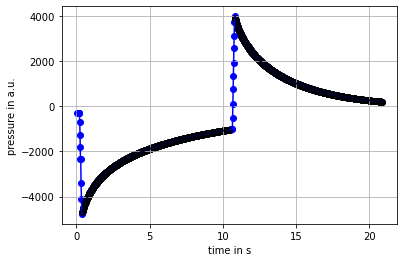

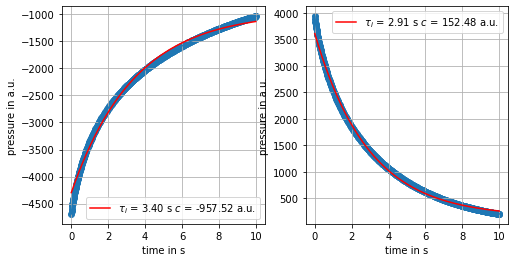

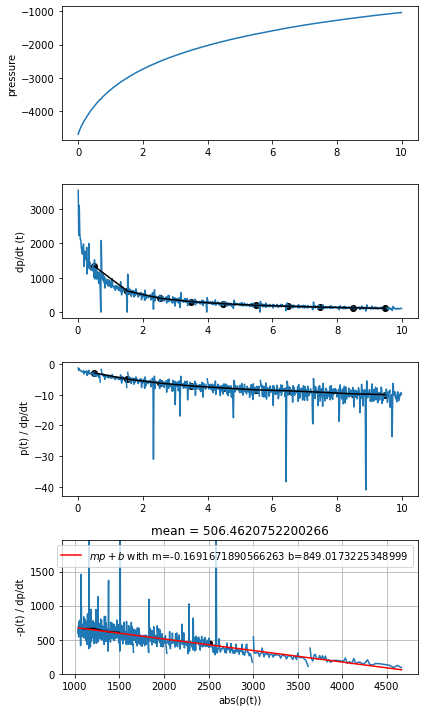

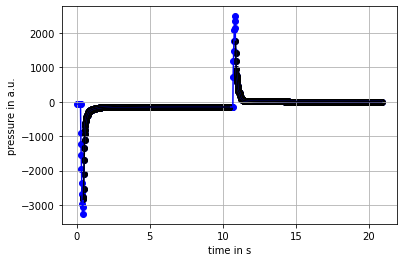

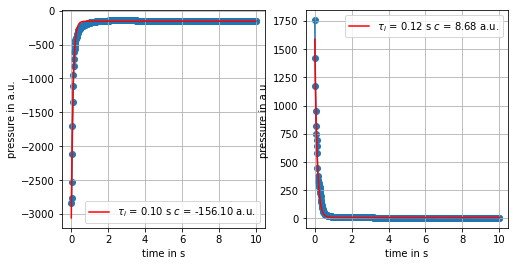

...

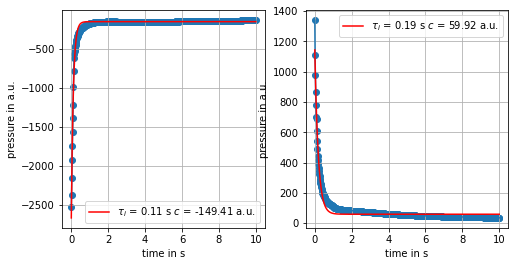

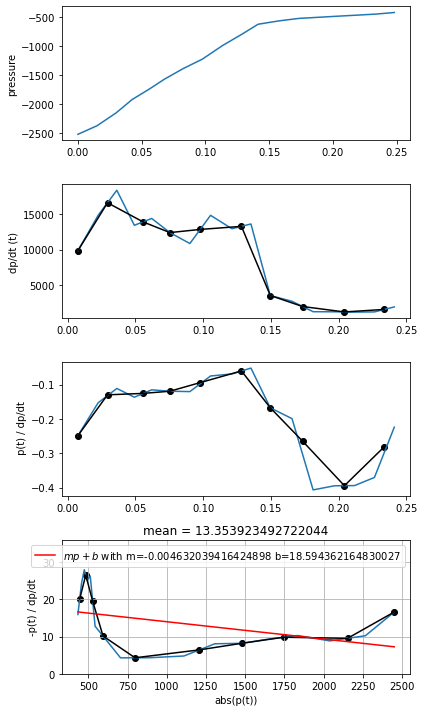

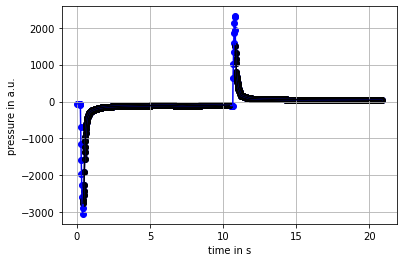

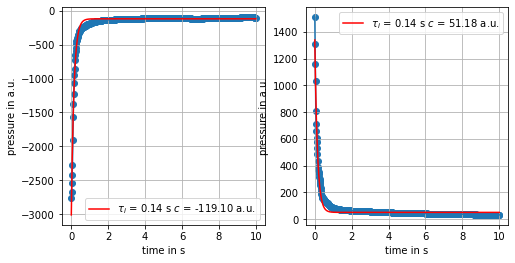

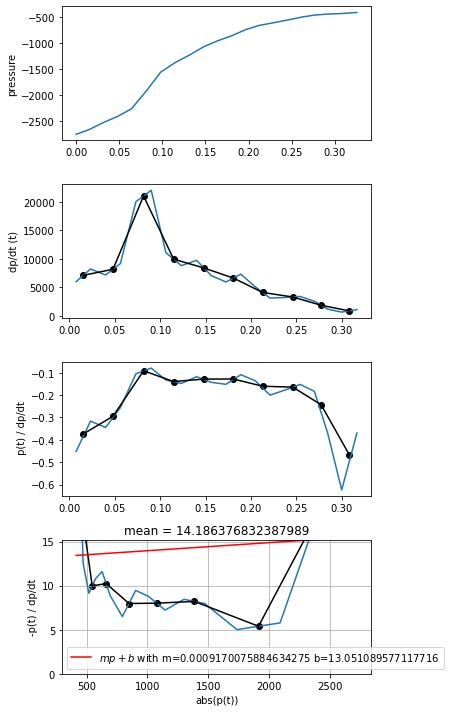

In [56]:
n_offset = 21 ## since wellplate can be full with other experiments
recycling_tip_well = tiprack.wells()[92]

left_pipette.pick_up_tip(recycling_tip_well)
### do viscosity measurement (only once)
evaluator = ViscosityProxyEvaluator()
recycling_material_characterization = evaluator.measure_viscosity_proxies(location = recycling_input_well.bottom(z=10.0),
                                             volume_ul = 100, settle_time_s = 10)


input_viscosity = viscosity_from_integral(recycling_material_characterization.pressure_integral_aspirate) 
print("measured input viscosity:", input_viscosity)
left_pipette.return_tip()
for i in range(10):
    n_target = i+n_offset
    ## measure viscosity of the input mix (here constant but could potentially vary)
    ### fetch a tip
    

    parameterization, trial_index = finetune_ax_client.get_next_trial(
                             fixed_features=FixedFeatures(parameters = {"input_soap_viscosity": input_viscosity})
    )

    # extract parameters
    impure_soap_fraction = parameterization["impure_soap_fraction"]

    ## mix soap_mix with water
    prepare_mix(n_well=n_target, 
                material_origin_location = recycling_input_well.bottom(z=10.0), 
                material_pipette_well = recycling_tip_well,
                material_fraction = impure_soap_fraction,
                water_fraction = 1-impure_soap_fraction,
                use_mounted_pipette = False)

    ## mix and measure (recycling) output
    output_characterization = mix_and_measure(n_target)
    ## measure viscosity
    measured_output_viscosity = viscosity_from_integral(output_characterization.pressure_integral_aspirate) 

    print("measured_viscosity:", measured_output_viscosity)

    cost_value = target_deviation(measured_output_viscosity)
    finetune_ax_client.complete_trial(trial_index=trial_index, raw_data=cost_value)
    print("cost_value:", cost_value)

    ## document the experiment
    experiment_series.experiments.append(SoapExperiment(
        observed_soap_input_viscosity = input_viscosity,
        impure_soap_fraction = impure_soap_fraction,
        mix_viscosity = measured_output_viscosity
    ))
    
    ## save with new name to keep previous dataset intact
    with open("data/production_input_output_characterized_soap_mixing_data_001.json", 'w') as f:
        json.dump(experiment_series.dict(), f)
    

    ## some visualization
    finetune_ax_client.fit_model()
    model = finetune_ax_client.generation_strategy.model
    render(plot_slice(model, param_name = "impure_soap_fraction" ,metric_name = "target_deviation",
                   slice_values={"input_soap_viscosity": input_viscosity}))


## Observations
* when using (log(value)-log(target))**2 all suggested mixtures resulted in too high viscosities!! 
* when using (value-target)**2 they scatter all over the place. 

* question: how is it possible to fit the (physical) model itself, rather than the cost-funciton? 

## Start over and try viscosity model directly instead of  cost function.
* with new soap mix, it was empty in between

In [70]:
with open("data/input_output_characterized_soap_mixing_data_001.json") as f:
    experiment_series = SoapExperimentSeries.parse_obj(json.load(f))

In [71]:
print(len(experiment_series.experiments))

30


In [72]:
target_viscosity = 100
recycling_input_well = raw_material_plate.wells()[2] 

## actually unused, can maybe skipped
viscosity_strategy = GenerationStrategy(
    steps=[
        GenerationStep(
            model=Models.BOTORCH_MODULAR,
            num_trials=-1,
            max_parallelism=1,
        ),
    ]
)

## we need only the model building feature, here.
viscosity_ax_client = AxClient(generation_strategy=viscosity_strategy)

viscosity_ax_client.create_experiment(
    parameters=[
        {"name": "input_soap_viscosity", "type": "range", "bounds": [0.0, 1500.0]},# will be fixed measured
        # feature, which has to be contained in the model.
        {"name": "impure_soap_fraction", "type": "range", "bounds": [0.0, 1.0]}
        # this will be varied to reach the necessary target.
    ],
    objectives={
        "viscosity": ObjectiveProperties(minimize=False)
    },
)

## initialize model with known data:
for i, experiment in enumerate(experiment_series.experiments):
    viscosity_ax_client.attach_trial(
        {"input_soap_viscosity": experiment.observed_soap_input_viscosity,
         "impure_soap_fraction": experiment.impure_soap_fraction}
    )
    viscosity_ax_client.complete_trial(trial_index=i, 
                                       raw_data={"viscosity":experiment.mix_viscosity}) # estimated uncertainty. might be skipped


[INFO 02-07 05:27:21] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 02-07 05:27:21] ax.service.utils.instantiation: Inferred value type of ParameterType.FLOAT for parameter input_soap_viscosity. If that is not the expected value type, you can explicitly specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 02-07 05:27:21] ax.service.utils.instantiation: Inferred value type of ParameterType.FLOAT for parameter impure_soap_fraction. If that is not the expected value type, you can explicitly specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 02-07 05:27:21] ax.service.utils.instantiation: Created search space: SearchSpace(parameters=[RangeParameter(name='input_soap_viscosity', parameter_type=FLOAT, range=[0.0, 1500.0]), RangeParameter(name='impure_soap_fraction', parameter_typ

[INFO 02-07 05:27:23] ax.service.ax_client: Completed trial 26 with data: {'viscosity': (4.068144, 0.203407)}.
[INFO 02-07 05:27:23] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 1200.836459, 'impure_soap_fraction': 0.145638}] as trial 27.
[INFO 02-07 05:27:23] ax.service.ax_client: Completed trial 27 with data: {'viscosity': (1.0, 0.05)}.
[INFO 02-07 05:27:23] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 1249.614976, 'impure_soap_fraction': 0.883979}] as trial 28.
[INFO 02-07 05:27:23] ax.service.ax_client: Completed trial 28 with data: {'viscosity': (882.06008, 44.103004)}.
[INFO 02-07 05:27:23] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 14.249163, 'impure_soap_fraction': 0.019399}] as trial 29.
[INFO 02-07 05:27:23] ax.service.ax_client: Completed trial 29 with data: {'viscosity': (2.483728, 0.124186)}.


In [73]:
## fit model to data:
print("start fitting the model")
viscosity_ax_client.fit_model()
print("model finally fitted")
## plot a slice of the model: 

## what if the input soap viscosity is higher than the target value? 
model = viscosity_ax_client.generation_strategy.model
for possible_input_viscosity in [100,500,1200]:
    render(plot_slice(model, param_name = "impure_soap_fraction" ,metric_name = "viscosity",
               slice_values={"input_soap_viscosity": possible_input_viscosity}))

start fitting the model
model finally fitted


## once more: do the (production) optimization loop with restricted features. With direct physical modelling:

* the "recycling" input material currently is soap with some droplets of water (maybe 5%, but unknown, (that is the point))

aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  9.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 636
    # variables        = 3
    chi-square         = 993066.767
    reduced chi-square = 1568.82586
    Akaike info crit   = 4682.73353
    Bayesian info crit = 4696.09913
    R-squared          = 0.99852133
[[Variables]]
    a:   -4043.79129 +/- 6.80370685 (0.17%) (init = -500)
    tau:  3.94520055 +/- 0.02117085 (0.54%) (init = 0.01)
    c:   -179.924167 +/- 7.69178474 (4.28%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.9341
    C(a, c)   = -0.6553
    C(a, tau) = -0.4166
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 637
    # variables        = 3
    chi-square         = 382172.146
    reduced chi-sq

/tmp/ipykernel_101030/3675068744.py:353: RuntimeWarning:

divide by zero encountered in true_divide

/tmp/ipykernel_101030/3675068744.py:389: RuntimeWarning:

divide by zero encountered in true_divide



measured input viscosity: 743.205399711797
measured input viscosity: 743.205399711797
best_index: 868
best_viscosity 100.09157387751218
best_parameters: {'input_soap_viscosity': 743.205399711797, 'impure_soap_fraction': 0.8688688688688688}
transfer 173.77377377377377 ul material to well 36
aspiration target:  173.77377377377377  ul
aspirated. wait for settling
finally aspirated  191.15115115115114  ul
transfer 26.226226226226235 ul water to well 36
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 65
    # data points      = 648
    # variables        = 3
    chi-square         = 3024520.74
    reduced chi-square = 4689.17945
    Akaike info crit   = 5480.54539
    Bayesian info crit = 5493.96706
    R-squared          = 0.97382605
[[Variables]]
    a:   -3029.67992 +/- 25.7411128 (0.85%) (init = -500)
    tau:  0.364

[INFO 02-07 05:34:09] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 743.2054, 'impure_soap_fraction': 0.868869}] as trial 30.
[INFO 02-07 05:34:09] ax.service.ax_client: Completed trial 30 with data: {'viscosity': (78.765178, 7.876518)}.


measured_viscosity: 78.7651779367367


measured input viscosity: 743.205399711797
best_index: 950
best_viscosity 96.75064890390323
best_parameters: {'input_soap_viscosity': 743.205399711797, 'impure_soap_fraction': 0.950950950950951}
transfer 190.19019019019018 ul material to well 37
aspiration target:  190.19019019019018  ul
aspirated. wait for settling
finally aspirated  200.0  ul
transfer 9.80980980980981 ul water to well 37
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33
    # data points      = 638
    # variables        = 3
    chi-square         = 1149020.70
    reduced chi-square = 1809.48141
    Akaike info crit   = 4788.50050
    Bayesian info crit = 4801.87551
    R-squared          = 0.99793728
[[Variables]]
    a:   -3763.26684 +/- 7.37806023 (0.20%) (init = -500)
    tau:  2.10507134 +/- 0.00922215 (0.44%) (init = 0.01)
    c:   -218.085

/tmp/ipykernel_101030/3675068744.py:353: RuntimeWarning:

divide by zero encountered in true_divide

/tmp/ipykernel_101030/3675068744.py:389: RuntimeWarning:

divide by zero encountered in true_divide

[INFO 02-07 05:38:06] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 743.2054, 'impure_soap_fraction': 0.950951}] as trial 31.
[INFO 02-07 05:38:07] ax.service.ax_client: Completed trial 31 with data: {'viscosity': (419.601053, 41.960105)}.


measured_viscosity: 419.6010525023


measured input viscosity: 743.205399711797
best_index: 874
best_viscosity 99.48818218853006
best_parameters: {'input_soap_viscosity': 743.205399711797, 'impure_soap_fraction': 0.8748748748748749}
transfer 174.974974974975 ul material to well 38
aspiration target:  174.974974974975  ul
aspirated. wait for settling
finally aspirated  192.4724724724725  ul
transfer 25.025025025025016 ul water to well 38
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 38
    # data points      = 633
    # variables        = 3
    chi-square         = 2505076.21
    reduced chi-square = 3976.31145
    Akaike info crit   = 5249.36643
    Bayesian info crit = 5262.71784
    R-squared          = 0.97264357
[[Variables]]
    a:   -3809.80505 +/- 33.8156791 (0.89%) (init = -500)
    tau:  0.20103770 +/- 0.00266014 (1.32%) (init = 0.01)
    c:

[INFO 02-07 05:42:02] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 743.2054, 'impure_soap_fraction': 0.874875}] as trial 32.
[INFO 02-07 05:42:02] ax.service.ax_client: Completed trial 32 with data: {'viscosity': (49.883941, 4.988394)}.


measured_viscosity: 49.88394077229403


measured input viscosity: 743.205399711797
best_index: 856
best_viscosity 99.43859298423284
best_parameters: {'input_soap_viscosity': 743.205399711797, 'impure_soap_fraction': 0.8568568568568569}
transfer 171.37137137137137 ul material to well 39
aspiration target:  171.37137137137137  ul
aspirated. wait for settling
finally aspirated  188.5085085085085  ul
transfer 28.628628628628626 ul water to well 39
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 34
    # data points      = 632
    # variables        = 3
    chi-square         = 2003313.88
    reduced chi-square = 3184.91873
    Akaike info crit   = 5100.81991
    Bayesian info crit = 5114.16658
    R-squared          = 0.97820922
[[Variables]]
    a:   -3749.51674 +/- 29.9763172 (0.80%) (init = -500)
    tau:  0.19677641 +/- 0.00235041 (1.19%) (init = 0.01)
  

[INFO 02-07 05:45:59] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 743.2054, 'impure_soap_fraction': 0.856857}] as trial 33.
[INFO 02-07 05:45:59] ax.service.ax_client: Completed trial 33 with data: {'viscosity': (50.522506, 5.052251)}.


measured_viscosity: 50.52250606985022


measured input viscosity: 743.205399711797
best_index: 895
best_viscosity 99.9498122408435
best_parameters: {'input_soap_viscosity': 743.205399711797, 'impure_soap_fraction': 0.8958958958958959}
transfer 179.1791791791792 ul material to well 40
aspiration target:  179.1791791791792  ul
aspirated. wait for settling
finally aspirated  197.0970970970971  ul
transfer 20.820820820820817 ul water to well 40
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 34
    # data points      = 643
    # variables        = 3
    chi-square         = 3483854.72
    reduced chi-square = 5443.52301
    Akaike info crit   = 5534.19584
    Bayesian info crit = 5547.59427
    R-squared          = 0.97289444
[[Variables]]
    a:   -3476.90472 +/- 30.3165599 (0.87%) (init = -500)
    tau:  0.32194902 +/- 0.00425267 (1.32%) (init = 0.01)
    c

/tmp/ipykernel_101030/3675068744.py:353: RuntimeWarning:

divide by zero encountered in true_divide

/tmp/ipykernel_101030/3675068744.py:389: RuntimeWarning:

divide by zero encountered in true_divide

[INFO 02-07 05:49:54] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 743.2054, 'impure_soap_fraction': 0.895896}] as trial 34.
[INFO 02-07 05:49:54] ax.service.ax_client: Completed trial 34 with data: {'viscosity': (77.583371, 7.758337)}.


measured_viscosity: 77.58337070219437


measured input viscosity: 743.205399711797
best_index: 902
best_viscosity 100.88150974006341
best_parameters: {'input_soap_viscosity': 743.205399711797, 'impure_soap_fraction': 0.9029029029029029}
transfer 180.58058058058057 ul material to well 41
aspiration target:  180.58058058058057  ul
aspirated. wait for settling
finally aspirated  198.63863863863864  ul
transfer 19.419419419419427 ul water to well 41
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 41
    # data points      = 629
    # variables        = 3
    chi-square         = 2362135.34
    reduced chi-square = 3773.37915
    Akaike info crit   = 5183.26461
    Bayesian info crit = 5196.59700
    R-squared          = 0.99105722
[[Variables]]
    a:   -3658.08053 +/- 17.9994759 (0.49%) (init = -500)
    tau:  0.73609559 +/- 0.00560376 (0.76%) (init = 0.01)


/tmp/ipykernel_101030/3675068744.py:353: RuntimeWarning:

divide by zero encountered in true_divide

/tmp/ipykernel_101030/3675068744.py:379: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/tmp/ipykernel_101030/3675068744.py:389: RuntimeWarning:

divide by zero encountered in true_divide

[INFO 02-07 05:53:50] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 743.2054, 'impure_soap_fraction': 0.902903}] as trial 35.
[INFO 02-07 05:53:50] ax.service.ax_client: Completed trial 35 with data: {'viscosity': (161.394158, 16.139416)}.


measured_viscosity: 161.39415791721837


measured input viscosity: 743.205399711797
best_index: 897
best_viscosity 98.81901709912252
best_parameters: {'input_soap_viscosity': 743.205399711797, 'impure_soap_fraction': 0.8978978978978979}
transfer 179.5795795795796 ul material to well 42
aspiration target:  179.5795795795796  ul
aspirated. wait for settling
finally aspirated  197.53753753753756  ul
transfer 20.420420420420427 ul water to well 42
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 636
    # variables        = 3
    chi-square         = 3154178.73
    reduced chi-square = 4982.90479
    Akaike info crit   = 5417.74954
    Bayesian info crit = 5431.11513
    R-squared          = 0.98663061
[[Variables]]
    a:   -4000.62372 +/- 24.2638935 (0.61%) (init = -500)
    tau:  0.48301386 +/- 0.00450854 (0.93%) (init = 0.01)
   

[INFO 02-07 05:57:47] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 743.2054, 'impure_soap_fraction': 0.897898}] as trial 36.
[INFO 02-07 05:57:47] ax.service.ax_client: Completed trial 36 with data: {'viscosity': (118.193176, 11.819318)}.


measured_viscosity: 118.19317594438772


measured input viscosity: 743.205399711797
best_index: 896
best_viscosity 100.18294060549475
best_parameters: {'input_soap_viscosity': 743.205399711797, 'impure_soap_fraction': 0.8968968968968969}
transfer 179.37937937937937 ul material to well 43
aspiration target:  179.37937937937937  ul
aspirated. wait for settling
finally aspirated  197.3173173173173  ul
transfer 20.62062062062062 ul water to well 43
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 42
    # data points      = 642
    # variables        = 3
    chi-square         = 1742325.20
    reduced chi-square = 2726.64351
    Akaike info crit   = 5081.74368
    Bayesian info crit = 5095.13744
    R-squared          = 0.98461838
[[Variables]]
    a:   -3893.45674 +/- 25.8658432 (0.66%) (init = -500)
    tau:  0.22214420 +/- 0.00222324 (1.00%) (init = 0.01)
  

[INFO 02-07 06:01:43] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 743.2054, 'impure_soap_fraction': 0.896897}] as trial 37.
[INFO 02-07 06:01:43] ax.service.ax_client: Completed trial 37 with data: {'viscosity': (59.315424, 5.931542)}.


measured_viscosity: 59.31542432003259


measured input viscosity: 743.205399711797
best_index: 733
best_viscosity 99.9263548378884
best_parameters: {'input_soap_viscosity': 743.205399711797, 'impure_soap_fraction': 0.7337337337337337}
transfer 146.74674674674674 ul material to well 44
aspiration target:  146.74674674674674  ul
aspirated. wait for settling
finally aspirated  161.4214214214214  ul
transfer 53.25325325325325 ul water to well 44
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 41
    # data points      = 639
    # variables        = 3
    chi-square         = 369422.927
    reduced chi-square = 580.853659
    Akaike info crit   = 4069.90770
    Bayesian info crit = 4083.28741
    R-squared          = 0.85079827
[[Variables]]
    a:   -866.729322 +/- 18.2932027 (2.11%) (init = -500)
    tau:  0.07418156 +/- 0.00246581 (3.32%) (init = 0.01)
    

/usr/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning:

Mean of empty slice.

/usr/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning:

invalid value encountered in double_scalars

[INFO 02-07 06:05:38] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 743.2054, 'impure_soap_fraction': 0.733734}] as trial 38.
[INFO 02-07 06:05:38] ax.service.ax_client: Completed trial 38 with data: {'viscosity': (11.846227, 1.184623)}.


measured_viscosity: 11.846227104355304


measured input viscosity: 743.205399711797
best_index: 815
best_viscosity 100.17381647390403
best_parameters: {'input_soap_viscosity': 743.205399711797, 'impure_soap_fraction': 0.8158158158158159}
transfer 163.16316316316318 ul material to well 45
aspiration target:  163.16316316316318  ul
aspirated. wait for settling
finally aspirated  179.4794794794795  ul
transfer 36.83683683683683 ul water to well 45
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33
    # data points      = 633
    # variables        = 3
    chi-square         = 491395.067
    reduced chi-square = 779.992170
    Akaike info crit   = 4218.31957
    Bayesian info crit = 4231.67098
    R-squared          = 0.98650491
[[Variables]]
    a:   -2540.95176 +/- 15.5582054 (0.61%) (init = -500)
    tau:  0.16086057 +/- 0.00151106 (0.94%) (init = 0.01)
  

/tmp/ipykernel_101030/3675068744.py:353: RuntimeWarning:

divide by zero encountered in true_divide

/tmp/ipykernel_101030/3675068744.py:389: RuntimeWarning:

divide by zero encountered in true_divide

[INFO 02-07 06:09:36] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 743.2054, 'impure_soap_fraction': 0.815816}] as trial 39.
[INFO 02-07 06:09:36] ax.service.ax_client: Completed trial 39 with data: {'viscosity': (30.764896, 3.07649)}.


measured_viscosity: 30.764895668164595


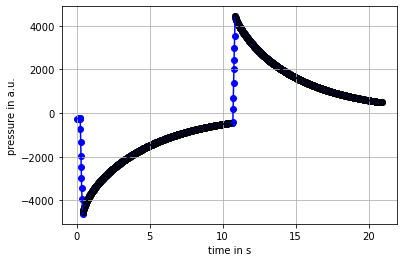

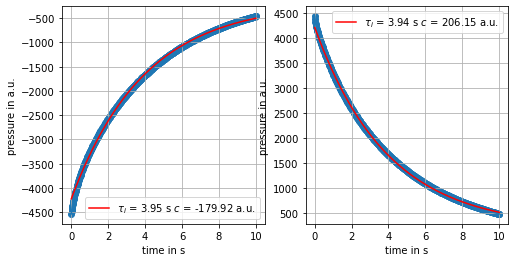

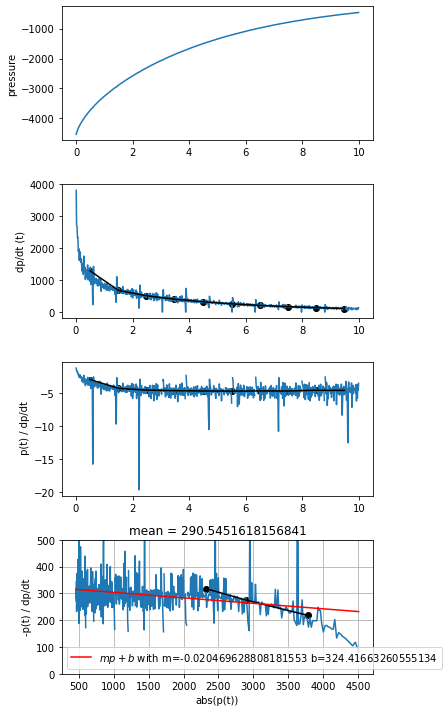

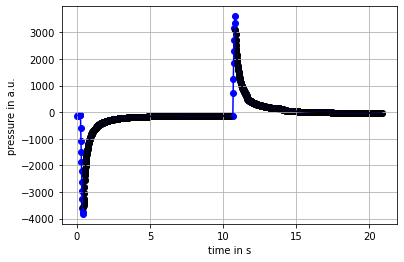

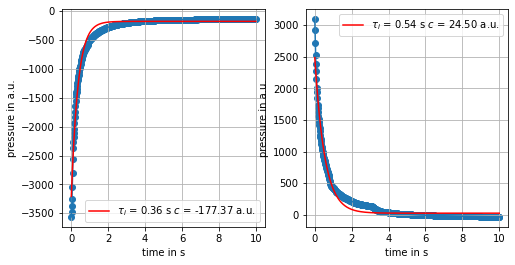

...

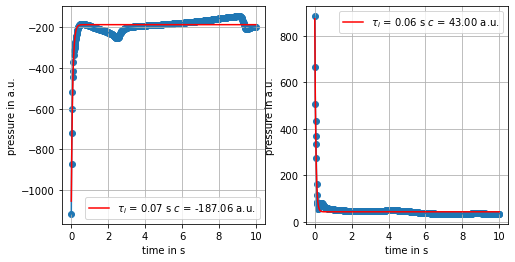

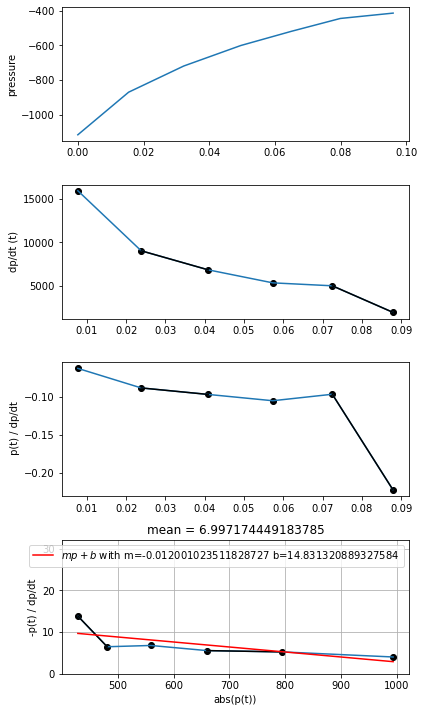

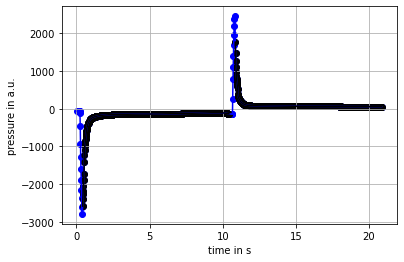

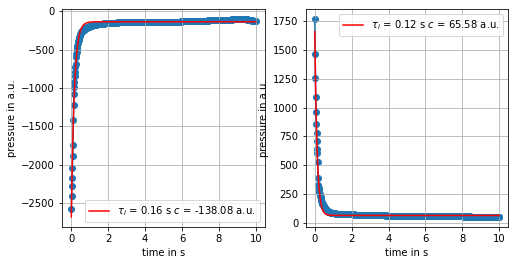

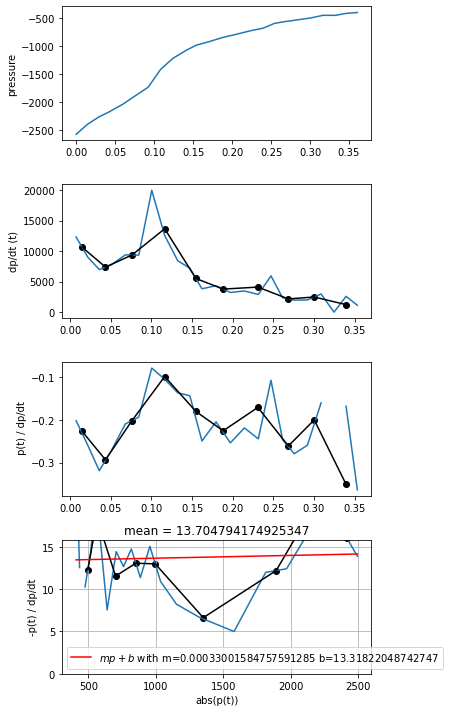

In [77]:
n_offset = 36 ## since wellplate can be full with other experiments
recycling_tip_well = tiprack.wells()[92]

# measure input viscosity, now only once. 
### fetch a tip
left_pipette.pick_up_tip(recycling_tip_well)
### do viscosity measurement
evaluator = ViscosityProxyEvaluator()
recycling_material_characterization = evaluator.measure_viscosity_proxies(location = recycling_input_well.bottom(z=5.0),
                                             volume_ul = 100, settle_time_s = 10)


input_viscosity = viscosity_from_integral(recycling_material_characterization.pressure_integral_aspirate) 
print("measured input viscosity:", input_viscosity)
left_pipette.return_tip()


for i in range(10):
    n_target = i+n_offset
    ## measure viscosity of the input mix (here constant but could potentially vary)
    
    print("measured input viscosity:", input_viscosity)
    ## evaluate viscosity model to find best value (this part will have to be tuned if dimensinality is higher)
    viscosity_ax_client.fit_model()
    model = viscosity_ax_client.generation_strategy.model
    obs_feat_list = [ObservationFeatures(parameters = {"input_soap_viscosity": input_viscosity,
                                                  "impure_soap_fraction": n}) for n in np.linspace(0,1, 1000)]
    
    ## some visualization

    viscosity_model = viscosity_ax_client.generation_strategy.model
    render(plot_slice(viscosity_model, param_name="impure_soap_fraction", metric_name="viscosity",
                      slice_values={"input_soap_viscosity": input_viscosity}))
    render(plot_contour(viscosity_model, param_x="impure_soap_fraction", param_y="input_soap_viscosity", metric_name=
    "viscosity"))
    
    ## find the best value
    means, covariances = model.predict(obs_feat_list)
    viscosity_values = np.array(means["viscosity"])
    
    ## find best value    
    best_index = np.argmin(np.abs(viscosity_values-target_viscosity))
    print("best_index:", best_index)
    print("best_viscosity", viscosity_values[best_index])
    promising_parameters = obs_feat_list[best_index].parameters
    print("best_parameters:", promising_parameters)
    
    # extract parameters
    impure_soap_fraction = promising_parameters["impure_soap_fraction"]

    ## mix soap_mix with water
    prepare_mix(n_well=n_target, 
                material_origin_location = recycling_input_well.bottom(z=5.0), 
                material_pipette_well = recycling_tip_well,
                material_fraction = impure_soap_fraction,
                water_fraction = 1-impure_soap_fraction,
                use_mounted_pipette = False)

    ## mix and measure (recycling) output
    output_characterization = mix_and_measure(n_target)
    ## measure viscosity
    measured_output_viscosity = viscosity_from_integral(output_characterization.pressure_integral_aspirate) 

    print("measured_viscosity:", measured_output_viscosity)

    ## document the experiment
    experiment_series.experiments.append(SoapExperiment(
        observed_soap_input_viscosity = input_viscosity,
        impure_soap_fraction = impure_soap_fraction,
        mix_viscosity = measured_output_viscosity
    ))
    
    ## save with new name to keep previous dataset intact
    with open("data/direct_modelling_production_input_output_characterized_soap_mixing_data_001.json", 'w') as f:
        json.dump(experiment_series.dict(), f)
        
    viscosity_ax_client.attach_trial(
        {"input_soap_viscosity": experiment_series.experiments[-1].observed_soap_input_viscosity,
         "impure_soap_fraction": experiment_series.experiments[-1].impure_soap_fraction}
    )
    viscosity_val = experiment_series.experiments[
        -1].mix_viscosity
    viscosity_ax_client.complete_trial(trial_index=len(experiment_series.experiments)-1,
                                       raw_data={"viscosity":viscosity_val})
   
    

    

* this looks much, much better than before. The inaccuracy was due to low filling of the mixing wells. Air was sometimes sucked in during measurements, resulting in higher inaccuracy. The Algorithm performed still pretty well, given this situation.

In [82]:
## what was the best experiment? 
measured_viscosites = np.array([experiment.mix_viscosity for experiment in experiment_series.experiments])
best_index = np.argmin(np.abs(measured_viscosites-target_viscosity))
print("best experiment was:", experiment_series.experiments[best_index])

best experiment was: input_soap_fraction=None observed_soap_input_viscosity=743.205399711797 impure_soap_fraction=0.8978978978978979 mix_viscosity=118.19317594438772


## even once more: do the (production) optimization loop with restricted features. With direct physical modelling and different target:

* the "recycling" input material currently is soap with some droplets of water (maybe 5%, but unknown, (that is the point))

In [83]:
target_viscosity = 10
recycling_input_well = raw_material_plate.wells()[2] 

## actually unused, can maybe skipped
viscosity_strategy = GenerationStrategy(
    steps=[
        GenerationStep(
            model=Models.BOTORCH_MODULAR,
            num_trials=-1,
            max_parallelism=1,
        ),
    ]
)

## we need only the model building feature, here.
viscosity_ax_client = AxClient(generation_strategy=viscosity_strategy)

viscosity_ax_client.create_experiment(
    parameters=[
        {"name": "input_soap_viscosity", "type": "range", "bounds": [0.0, 1500.0]},# will be fixed measured
        # feature, which has to be contained in the model.
        {"name": "impure_soap_fraction", "type": "range", "bounds": [0.0, 1.0]}
        # this will be varied to reach the necessary target.
    ],
    objectives={
        "viscosity": ObjectiveProperties(minimize=False)
    },
)

## initialize model with known data:
for i, experiment in enumerate(experiment_series.experiments):
    viscosity_ax_client.attach_trial(
        {"input_soap_viscosity": experiment.observed_soap_input_viscosity,
         "impure_soap_fraction": experiment.impure_soap_fraction}
    )
    viscosity_ax_client.complete_trial(trial_index=i, 
                                       raw_data={"viscosity":experiment.mix_viscosity}) # estimated uncertainty. might be skipped


[INFO 02-07 06:23:54] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 02-07 06:23:54] ax.service.utils.instantiation: Inferred value type of ParameterType.FLOAT for parameter input_soap_viscosity. If that is not the expected value type, you can explicitly specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 02-07 06:23:54] ax.service.utils.instantiation: Inferred value type of ParameterType.FLOAT for parameter impure_soap_fraction. If that is not the expected value type, you can explicitly specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 02-07 06:23:54] ax.service.utils.instantiation: Created search space: SearchSpace(parameters=[RangeParameter(name='input_soap_viscosity', parameter_type=FLOAT, range=[0.0, 1500.0]), RangeParameter(name='impure_soap_fraction', parameter_typ

[INFO 02-07 06:23:56] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 1200.836459, 'impure_soap_fraction': 0.145638}] as trial 27.
[INFO 02-07 06:23:56] ax.service.ax_client: Completed trial 27 with data: {'viscosity': (1.0, None)}.
[INFO 02-07 06:23:56] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 1249.614976, 'impure_soap_fraction': 0.883979}] as trial 28.
[INFO 02-07 06:23:56] ax.service.ax_client: Completed trial 28 with data: {'viscosity': (882.06008, None)}.
[INFO 02-07 06:23:56] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 14.249163, 'impure_soap_fraction': 0.019399}] as trial 29.
[INFO 02-07 06:23:56] ax.service.ax_client: Completed trial 29 with data: {'viscosity': (2.483728, None)}.
[INFO 02-07 06:23:56] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 743.2054, 'impure_soap_fraction': 0.868869}] as trial 30.
[INFO 02-07 06:23:57] ax.service.ax_

In [84]:
## fit model to data:
print("start fitting the model")
viscosity_ax_client.fit_model()
print("model finally fitted")
## plot a slice of the model: 

## what if the input soap viscosity is higher than the target value? 
model = viscosity_ax_client.generation_strategy.model
for possible_input_viscosity in [100,500,1200]:
    render(plot_slice(model, param_name = "impure_soap_fraction" ,metric_name = "viscosity",
               slice_values={"input_soap_viscosity": possible_input_viscosity}))

start fitting the model
model finally fitted


* looks more challanging to find good starting parameters for target viscosity of 20 mPas  let's see what will happen

In [ ]:
n_offset = 46 ## since wellplate can be full with other experiments
recycling_tip_well = tiprack.wells()[92]

# measure input viscosity, now only once. 
### fetch a tip
left_pipette.pick_up_tip(recycling_tip_well)
### do viscosity measurement
evaluator = ViscosityProxyEvaluator()
recycling_material_characterization = evaluator.measure_viscosity_proxies(location = recycling_input_well.bottom(z=5.0),
                                             volume_ul = 100, settle_time_s = 10)


input_viscosity = viscosity_from_integral(recycling_material_characterization.pressure_integral_aspirate) 
print("measured input viscosity:", input_viscosity)
left_pipette.return_tip()


for i in range(10):
    n_target = i+n_offset
    ## measure viscosity of the input mix (here constant but could potentially vary)
    
    print("measured input viscosity:", input_viscosity)
    ## evaluate viscosity model to find best value (this part will have to be tuned if dimensinality is higher)
    viscosity_ax_client.fit_model()
    model = viscosity_ax_client.generation_strategy.model
    obs_feat_list = [ObservationFeatures(parameters = {"input_soap_viscosity": input_viscosity,
                                                  "impure_soap_fraction": n}) for n in np.linspace(0,1, 1000)]
    
    ## some visualization

    viscosity_model = viscosity_ax_client.generation_strategy.model
    render(plot_slice(viscosity_model, param_name="impure_soap_fraction", metric_name="viscosity",
                      slice_values={"input_soap_viscosity": input_viscosity}))
    render(plot_contour(viscosity_model, param_x="impure_soap_fraction", param_y="input_soap_viscosity", metric_name=
    "viscosity"))
    
    ## find the best value
    means, covariances = model.predict(obs_feat_list)
    viscosity_values = np.array(means["viscosity"])
    
    ## find best value    
    best_index = np.argmin(np.abs(viscosity_values-target_viscosity))
    print("best_index:", best_index)
    print("best_viscosity", viscosity_values[best_index])
    promising_parameters = obs_feat_list[best_index].parameters
    print("best_parameters:", promising_parameters)
    
    # extract parameters
    impure_soap_fraction = promising_parameters["impure_soap_fraction"]

    ## mix soap_mix with water
    prepare_mix(n_well=n_target, 
                material_origin_location = recycling_input_well.bottom(z=5.0), 
                material_pipette_well = recycling_tip_well,
                material_fraction = impure_soap_fraction,
                water_fraction = 1-impure_soap_fraction,
                use_mounted_pipette = False)

    ## mix and measure (recycling) output
    output_characterization = mix_and_measure(n_target)
    ## measure viscosity
    measured_output_viscosity = viscosity_from_integral(output_characterization.pressure_integral_aspirate) 

    print("measured_viscosity:", measured_output_viscosity)

    ## document the experiment
    experiment_series.experiments.append(SoapExperiment(
        observed_soap_input_viscosity = input_viscosity,
        impure_soap_fraction = impure_soap_fraction,
        mix_viscosity = measured_output_viscosity
    ))
    
    ## save with new name to keep previous dataset intact
    with open("data/direct_modelling_production_input_output_characterized_soap_mixing_data_001_target=20.json", 'w') as f:
        json.dump(experiment_series.dict(), f)
        
    viscosity_ax_client.attach_trial(
        {"input_soap_viscosity": experiment_series.experiments[-1].observed_soap_input_viscosity,
         "impure_soap_fraction": experiment_series.experiments[-1].impure_soap_fraction}
    )
    viscosity_val = experiment_series.experiments[
        -1].mix_viscosity
    viscosity_ax_client.complete_trial(trial_index=len(experiment_series.experiments)-1,
                                       raw_data={"viscosity":viscosity_val})
   
    


aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  9.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 645
    # variables        = 3
    chi-square         = 2024928.23
    reduced chi-square = 3154.09382
    Akaike info crit   = 5199.40745
    Bayesian info crit = 5212.81520
    R-squared          = 0.99695107
[[Variables]]
    a:   -3973.05742 +/- 8.73923933 (0.22%) (init = -500)
    tau:  2.84015859 +/- 0.01731847 (0.61%) (init = 0.01)
    c:   -221.920966 +/- 6.54209900 (2.95%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(tau, c) = +0.8680
    C(a, c)   = -0.2531
    C(a, tau) = +0.1243
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 626
    # variables        = 3
    chi-square         = 2746010.85
    reduced chi-sq

/tmp/ipykernel_101030/3675068744.py:353: RuntimeWarning:

divide by zero encountered in true_divide

/tmp/ipykernel_101030/3675068744.py:389: RuntimeWarning:

divide by zero encountered in true_divide



measured input viscosity: 575.2545621075917
measured input viscosity: 575.2545621075917


best_index: 888
best_viscosity 10.019325977761966
best_parameters: {'input_soap_viscosity': 575.2545621075917, 'impure_soap_fraction': 0.8888888888888888}
transfer 177.77777777777777 ul material to well 46
aspiration target:  177.77777777777777  ul
aspirated. wait for settling
finally aspirated  195.55555555555554  ul
transfer 22.222222222222232 ul water to well 46
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 638
    # variables        = 3
    chi-square         = 2478778.05
    reduced chi-square = 3903.58748
    Akaike info crit   = 5279.03044
    Bayesian info crit = 5292.40545
    R-squared          = 0.98728640
[[Variables]]
    a:   -3520.12563 +/- 21.0326358 (0.60%) (init = -500)
    tau:  0.54392119 +/- 0.00490722 (0.90%) (init = 0.01)
    c:   -185.647701 +/- 2.79443958 (1.51%

/tmp/ipykernel_101030/3675068744.py:353: RuntimeWarning:

divide by zero encountered in true_divide

/tmp/ipykernel_101030/3675068744.py:389: RuntimeWarning:

divide by zero encountered in true_divide

[INFO 02-07 06:30:53] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 575.254562, 'impure_soap_fraction': 0.888889}] as trial 40.
[INFO 02-07 06:30:53] ax.service.ax_client: Completed trial 40 with data: {'viscosity': (117.923116, None)}.


measured_viscosity: 117.92311565830953
measured input viscosity: 575.2545621075917


best_index: 656
best_viscosity 9.821356737201057
best_parameters: {'input_soap_viscosity': 575.2545621075917, 'impure_soap_fraction': 0.6566566566566566}
transfer 131.3313313313313 ul material to well 47
aspiration target:  131.3313313313313  ul
aspirated. wait for settling
finally aspirated  144.46446446446444  ul
transfer 68.66866866866867 ul water to well 47
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 628
    # variables        = 3
    chi-square         = 8731.06604
    reduced chi-square = 13.9697057
    Akaike info crit   = 1658.96042
    Bayesian info crit = 1672.28805
    R-squared          = 0.99345060
[[Variables]]
    a:   -717.706951 +/- 2.93245732 (0.41%) (init = -500)
    tau:  0.06652532 +/- 4.3533e-04 (0.65%) (init = 0.01)
    c:   -221.239534 +/- 0.15117101 (0.07%) (i

/usr/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning:

Mean of empty slice.

/usr/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning:

invalid value encountered in double_scalars

[INFO 02-07 06:34:56] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 575.254562, 'impure_soap_fraction': 0.656657}] as trial 41.
[INFO 02-07 06:34:56] ax.service.ax_client: Completed trial 41 with data: {'viscosity': (10.649214, None)}.


measured_viscosity: 10.649214124635858
measured input viscosity: 575.2545621075917


best_index: 772
best_viscosity 9.915806194260114
best_parameters: {'input_soap_viscosity': 575.2545621075917, 'impure_soap_fraction': 0.7727727727727728}
transfer 154.55455455455456 ul material to well 48
aspiration target:  154.55455455455456  ul
aspirated. wait for settling
finally aspirated  170.01001001001  ul
transfer 45.44544544544544 ul water to well 48
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 41
    # data points      = 629
    # variables        = 3
    chi-square         = 187730.552
    reduced chi-square = 299.889061
    Akaike info crit   = 3590.43935
    Bayesian info crit = 3603.77175
    R-squared          = 0.97936802
[[Variables]]
    a:   -1393.39247 +/- 10.6223105 (0.76%) (init = -500)
    tau:  0.13338441 +/- 0.00153438 (1.15%) (init = 0.01)
    c:   -176.231724 +/- 0.70992341 (0.40%) (in

[INFO 02-07 06:38:57] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 575.254562, 'impure_soap_fraction': 0.772773}] as trial 42.
[INFO 02-07 06:38:57] ax.service.ax_client: Completed trial 42 with data: {'viscosity': (18.697771, None)}.


measured_viscosity: 18.697771229641774
measured input viscosity: 575.2545621075917


best_index: 658
best_viscosity 9.86993333674171
best_parameters: {'input_soap_viscosity': 575.2545621075917, 'impure_soap_fraction': 0.6586586586586587}
transfer 131.73173173173174 ul material to well 49
aspiration target:  131.73173173173174  ul
aspirated. wait for settling
finally aspirated  144.90490490490492  ul
transfer 68.26826826826826 ul water to well 49
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 37
    # data points      = 625
    # variables        = 3
    chi-square         = 17992.4097
    reduced chi-square = 28.9267038
    Akaike info crit   = 2105.97101
    Bayesian info crit = 2119.28427
    R-squared          = 0.99078426
[[Variables]]
    a:   -829.302099 +/- 4.05133973 (0.49%) (init = -500)
    tau:  0.07473716 +/- 5.8627e-04 (0.78%) (init = 0.01)
    c:   -220.975201 +/- 0.21835360 (0.10%) (

/usr/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning:

Mean of empty slice.

/usr/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning:

invalid value encountered in double_scalars

[INFO 02-07 06:42:58] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 575.254562, 'impure_soap_fraction': 0.658659}] as trial 43.
[INFO 02-07 06:42:58] ax.service.ax_client: Completed trial 43 with data: {'viscosity': (11.188125, None)}.


measured_viscosity: 11.188125108375063
measured input viscosity: 575.2545621075917


best_index: 661
best_viscosity 9.881218541927652
best_parameters: {'input_soap_viscosity': 575.2545621075917, 'impure_soap_fraction': 0.6616616616616616}
transfer 132.33233233233233 ul material to well 50
aspiration target:  132.33233233233233  ul
aspirated. wait for settling
finally aspirated  145.56556556556555  ul
transfer 67.66766766766767 ul water to well 50
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33
    # data points      = 627
    # variables        = 3
    chi-square         = 19491.3592
    reduced chi-square = 31.2361526
    Akaike info crit   = 2160.86105
    Bayesian info crit = 2174.18389
    R-squared          = 0.99279089
[[Variables]]
    a:   -1031.03972 +/- 4.43389343 (0.43%) (init = -500)
    tau:  0.06871065 +/- 4.5369e-04 (0.66%) (init = 0.01)
    c:   -218.870471 +/- 0.22643792 (0.10%) 

/usr/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning:

Mean of empty slice.

/usr/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning:

invalid value encountered in double_scalars

[INFO 02-07 06:46:58] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 575.254562, 'impure_soap_fraction': 0.661662}] as trial 44.
[INFO 02-07 06:46:58] ax.service.ax_client: Completed trial 44 with data: {'viscosity': (13.308491, None)}.


measured_viscosity: 13.308491097657601
measured input viscosity: 575.2545621075917


best_index: 753
best_viscosity 9.956837430176392
best_parameters: {'input_soap_viscosity': 575.2545621075917, 'impure_soap_fraction': 0.7537537537537538}
transfer 150.75075075075074 ul material to well 51
aspiration target:  150.75075075075074  ul
aspirated. wait for settling
finally aspirated  165.8258258258258  ul
transfer 49.249249249249246 ul water to well 51
aspiration target:  10  ul
aspirated. wait for settling
finally aspirated  10.0  ul
measurement finished
[[Model]]
    Model(exponential_curve)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 41
    # data points      = 640
    # variables        = 3
    chi-square         = 166410.429
    reduced chi-square = 261.240861
    Akaike info crit   = 3564.87635
    Bayesian info crit = 3578.26076
    R-squared          = 0.96052981
[[Variables]]
    a:   -910.728438 +/- 9.74361274 (1.07%) (init = -500)
    tau:  0.13860563 +/- 0.00225207 (1.62%) (init = 0.01)
    c:   -186.260323 +/- 0.65748922 (0.35%) 

/tmp/ipykernel_101030/3675068744.py:379: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[INFO 02-07 06:50:58] ax.core.experiment: Attached custom parameterizations [{'input_soap_viscosity': 575.254562, 'impure_soap_fraction': 0.753754}] as trial 45.
[INFO 02-07 06:50:58] ax.service.ax_client: Completed trial 45 with data: {'viscosity': (15.153678, None)}.


measured_viscosity: 15.153678245536064
measured input viscosity: 575.2545621075917


best_index: 723
best_viscosity 10.285122648257527
best_parameters: {'input_soap_viscosity': 575.2545621075917, 'impure_soap_fraction': 0.7237237237237237}
transfer 144.74474474474474 ul material to well 52
aspiration target:  144.74474474474474  ul
aspirated. wait for settling
finally aspirated  159.2192192192192  ul
